# 互评作业1: 数据探索性分析与数据预处理

## 数据预处理方法
1. 数据摘要

    标称属性，给出每个可能取值的频数
    数值属性，给出5数概括及缺失值的个数
2. 数据可视化

    使用直方图、盒图等检查数据分布及离群点
    
## 数据缺失值处理
观察数据集中缺失数据，分析其缺失的原因。分别使用下列四种策略对缺失值进行处理:
1. 将缺失部分剔除
2. 用最高频率值来填补缺失值
3. 通过属性的相关关系来填补缺失值
4. 通过数据对象之间的相似性来填补缺失值

注意：在处理后，要可视化地对比新旧数据集。

In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import re
import sys
import csv

In [2]:
"""
数据预处理

    标称属性，给出每个可能取值的频数
    数值属性，给出5数概括及缺失值的个数
"""
# 给出数据的基本信息，主要用于判断标称属性和数值属性
def columns_info(df,show_shape=True,new_df=None):
    print(df.info())
    if show_shape: print(df.shape)
    if new_df is not None:
        print();
        print(new_df.info())
        if show_shape: print(new_df.shape)  
    return None

# 标称属性每个可能取值的频数及直方图
def nominal_summary(df,nominal_index=None,head_n=50,new_df=None):
    # 根据频数绘制直方图
    def bar_describe(data,new_data=None,head_n=50):
        if new_data is None:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n])
            plt.xticks(rotation=90)
            plt.show()
        else:
            plt.figure(figsize=(24,8))
            #plt.subplot(211)
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n])
            plt.xticks(rotation=90)
            
            plt.figure(figsize=(24,8))
            #plt.subplot(212)
            plt.title('new_'+new_data.name,fontsize=30)
            plt.bar(new_data.index[:head_n],new_data.values[:head_n])
            plt.xticks(rotation=90)
            plt.show()
            
    # 获取数据中每个取值的频数
    frequency = {key: df[key].value_counts() for key in df.columns}
    new_frequency = None
    if new_df is not None:
        new_frequency = {key: new_df[key].value_counts() for key in new_df.columns}
        
    if nominal_index is None:
        nominal_index=df.columns
    if new_frequency is None:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=None,head_n=head_n)
    else:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=new_frequency[key],head_n=head_n)
    return None

# 数值属性缺失值个数及五数概括
def numerical_summary(df,numerical_index=None,new_df=None):
    shape=df.shape # 样本总数
    # 格式化输出五数概括和缺失值个数
    def data_describe(data,new_data=None):
        print('descriptive statistics (%s):' % data.name)
        info=data.describe()
        new_info = None
        if new_data is not None:
            new_info = new_data.describe()
            
        print("Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f}".format(
            info['min'],info['25%'],info['50%'],info['75%'],info['max']))
        print("Missing: {:d}".format(int(shape[0] - info['count'])))
        print()
        
        if new_info is not None:
            print("new Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f}".format(
            new_info['min'],new_info['25%'],new_info['50%'],new_info['75%'],new_info['max']))
            print("new Missing: {:d}".format(int(shape[0] - new_info['count'])))
            print()
        
    if numerical_index is None:
        print("Please provide the numerical index needed to be describe")
        return None
    
    # 获取数值属性的5数概况和缺失值个数
    if new_df is None:
        for key in numerical_index:
            data_describe(df[key])
    else:
        for key in numerical_index:
            data_describe(df[key],new_df[key])
    
    return None

"""
数据可视化

    使用直方图、盒图等检查数据分布及离群点
"""
# 数据可视化，用于绘制数值属性的直方图，盒图及散点图
def box_plot(df,ylabel=None,new_df=None):
    if new_df is None:
        plt.figure()
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set2')
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set1')

        plt.subplot(122)
        plt.title('new_Boxplot')
        sns.boxplot(y=ylabel,data=new_df,palette='Set2')
    
def hist_plot(df,ylabel=None,bins=10,new_df=None):
    if ylabel is None:
        print("Please provide ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)

        plt.subplot(122)
        plt.title('new_Histogram')
        sns.distplot(a=new_df[ylabel].dropna(),bins=bins,hist=True,kde=False)

def scatter_plot(df,xlabel=None,ylabel=None,new_df=None):
    if xlabel is None or ylabel is None:
        print("Please provide xlabel and ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)

        plt.subplot(122)
        plt.title('new Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=new_df)

def viz_pairs(df,ylabel=None,xlabel=None,bins=20,new_df=None):
    if ylabel is None or xlabel is None:
        print("Please provide xlabel and ylabel")
        return None
    box_plot(df,ylabel=ylabel,new_df=new_df)
    box_plot(df,ylabel=xlabel,new_df=new_df)
    hist_plot(df,ylabel=ylabel,bins=bins,new_df=new_df)
    hist_plot(df,ylabel=xlabel,bins=bins,new_df=new_df)
    scatter_plot(df,xlabel=xlabel,ylabel=ylabel,new_df=new_df)

"""
数据缺失值处理

    1. 将缺失部分剔除
    2. 用最高频率值来填补缺失值
    3. 通过属性的相关关系来填补缺失值
    4. 通过数据对象之间的相似性来填补缺失值
"""    
#将缺失部分剔除
def miss_drop(df):
    return df.dropna(axis=0,inplace=False)

#用最高频率值来填补缺失值
def miss_mode_fill(df):
    cpdf = df.copy(deep=True)
    for key in cpdf.columns:
        cpdf[key].fillna(cpdf[key].mode()[0],inplace=True)
    return cpdf
#通过属性的相关关系来填补缺失值

#通过数据对象之间的相似性来填补缺失值


# 数据集1 - Wine Reviews
130k wine reviews with variety, location, winery, price, and description.

> winemag-data-130k-v2.csv contains 10 columns and 130k rows of wine reviews.  
> winemag-data_first150k.csv contains 10 columns and 150k rows of wine reviews.

## winemag-data_first150k.csv

In [3]:
wine_reviews_dir = "~/Downloads/wine-reviews"
winemag150k=pd.read_csv(wine_reviews_dir+"/winemag-data_first150k.csv",sep=',',header='infer',index_col=0)

In [4]:
columns_info(winemag150k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
country        150925 non-null object
description    150930 non-null object
designation    105195 non-null object
points         150930 non-null int64
price          137235 non-null float64
province       150925 non-null object
region_1       125870 non-null object
region_2       60953 non-null object
variety        150930 non-null object
winery         150930 non-null object
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)


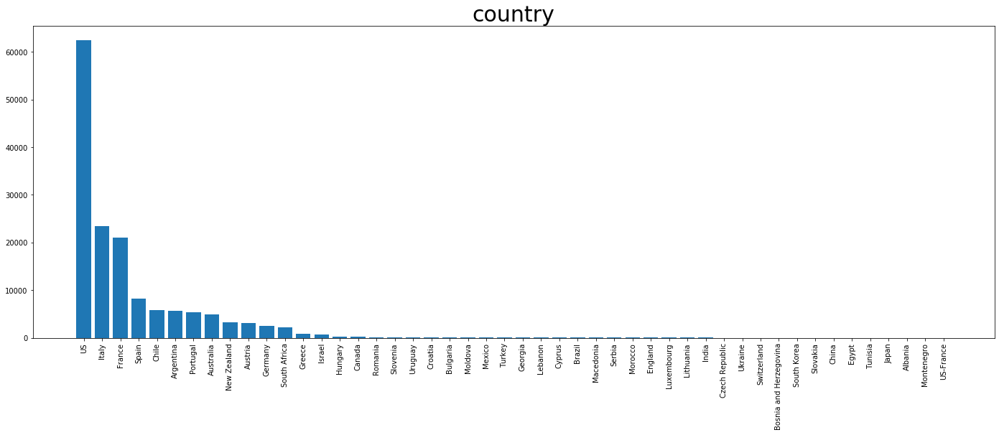

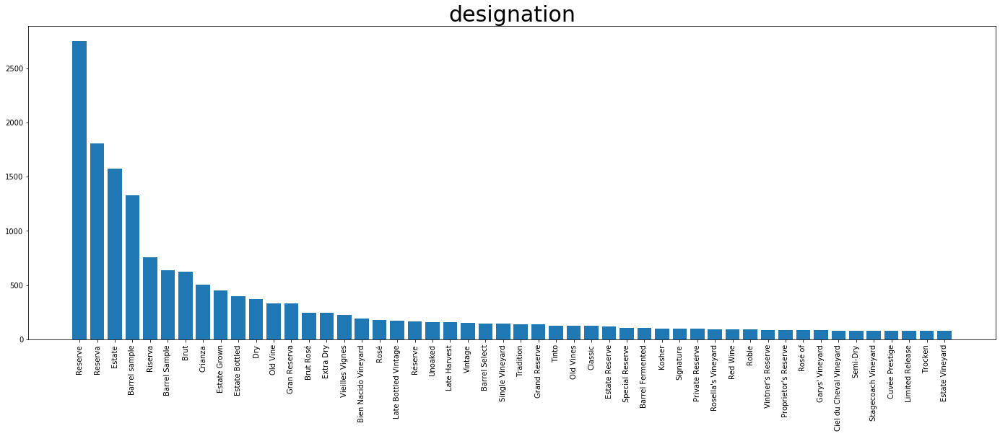

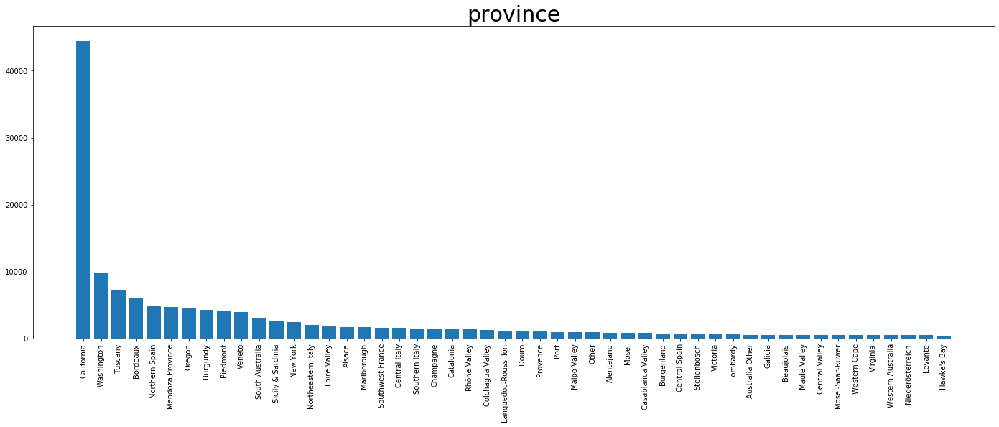

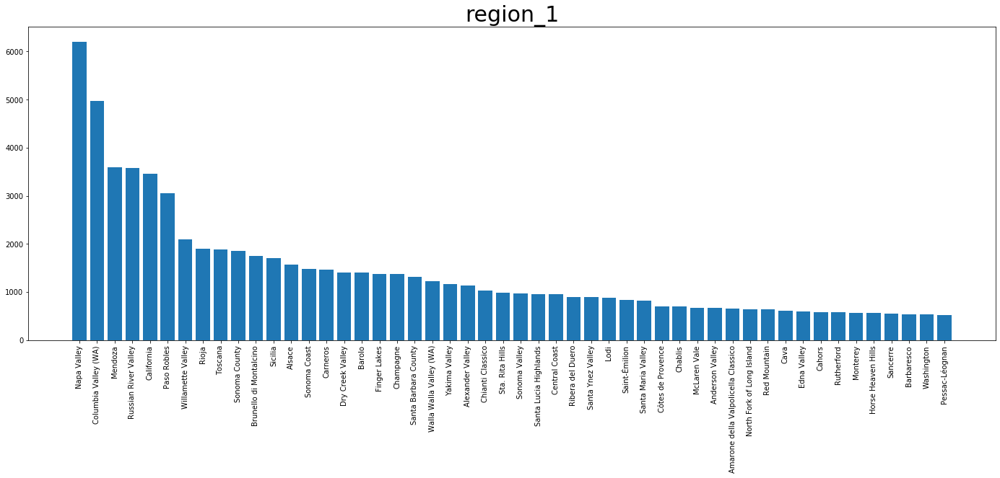

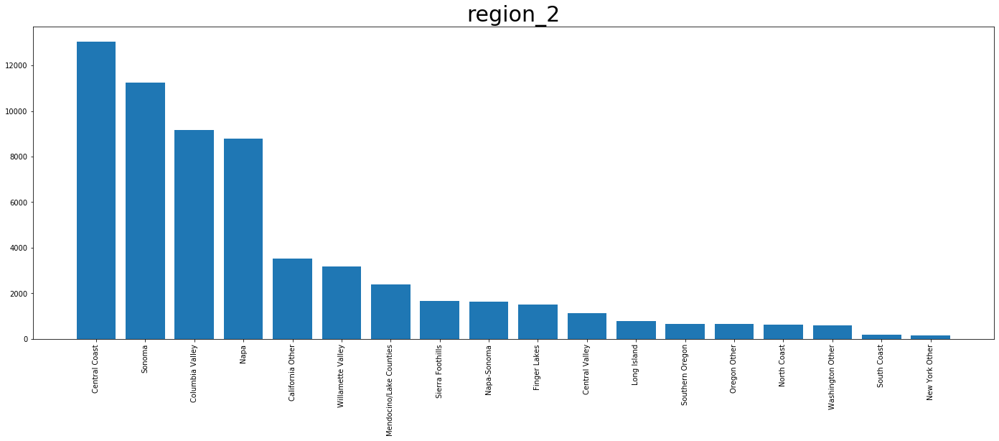

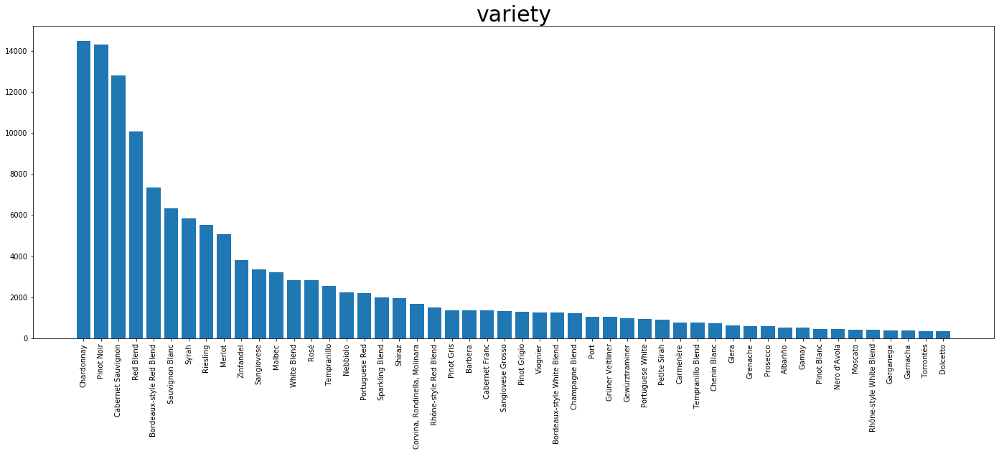

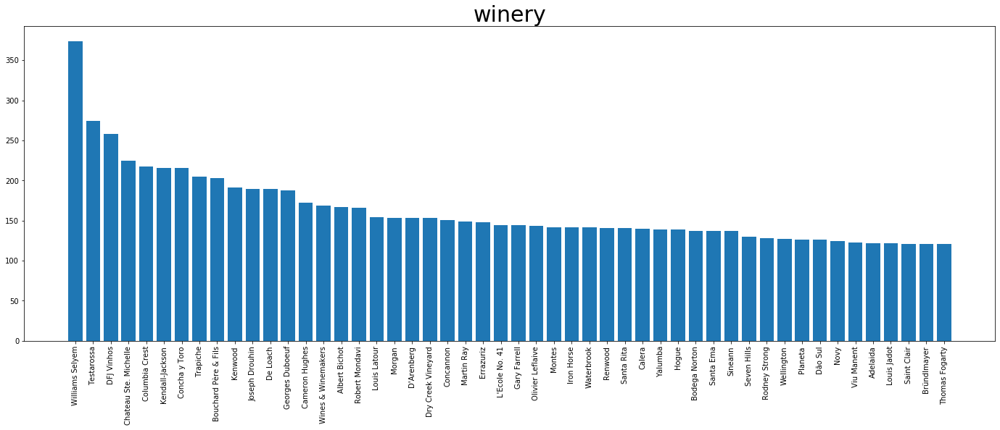

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695



In [5]:
# Nominal index
nominal_index = ['country', 'designation', 'province', 'region_1', 'region_2', 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag150k,new_df=None,nominal_index=nominal_index,head_n=50)
numerical_summary(winemag150k,new_df=None,numerical_index=numerical_index)

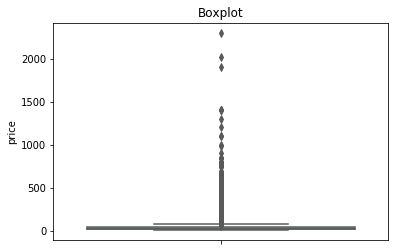

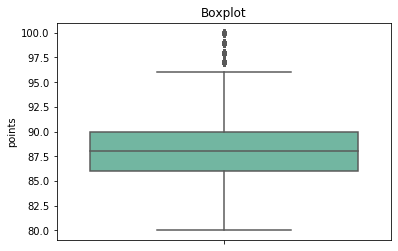

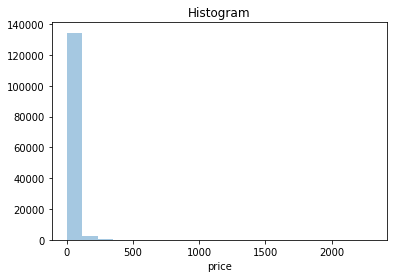

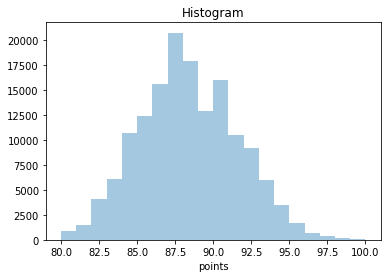

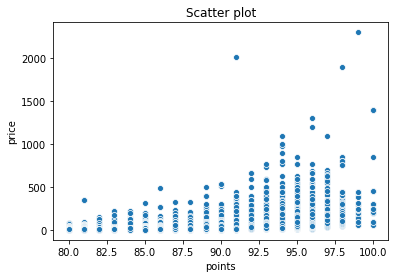

In [6]:
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
country        150925 non-null object
description    150930 non-null object
designation    105195 non-null object
points         150930 non-null int64
price          137235 non-null float64
province       150925 non-null object
region_1       125870 non-null object
region_2       60953 non-null object
variety        150930 non-null object
winery         150930 non-null object
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39241 entries, 0 to 150916
Data columns (total 10 columns):
country        39241 non-null object
description    39241 non-null object
designation    39241 non-null object
points         39241 non-null int64
price          39241 non-null float64
province       39241 non-null object
region_1       39241 non-null object
region_2       39241 non-null object
variety        39241 n

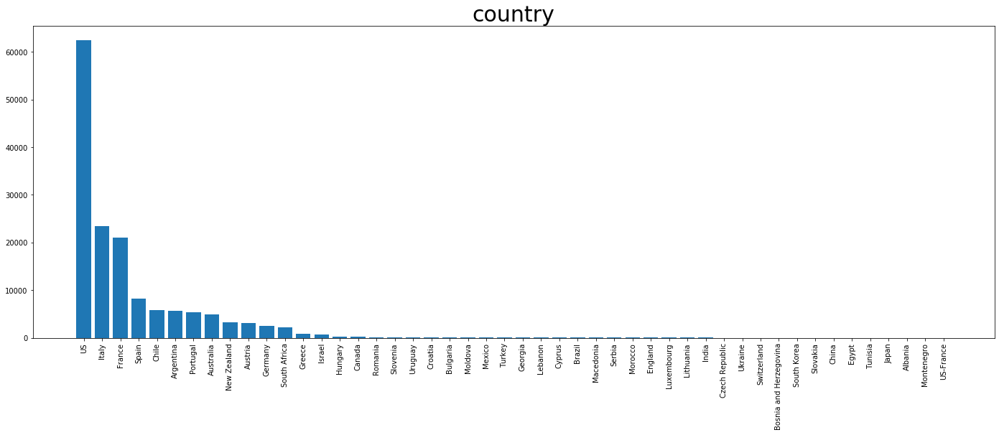

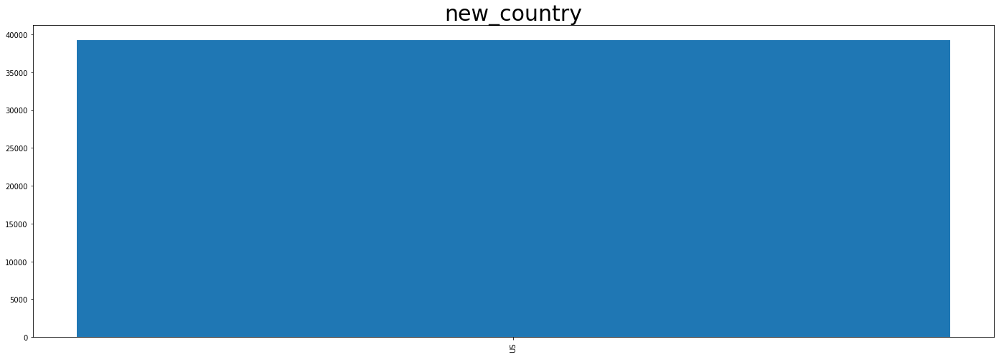

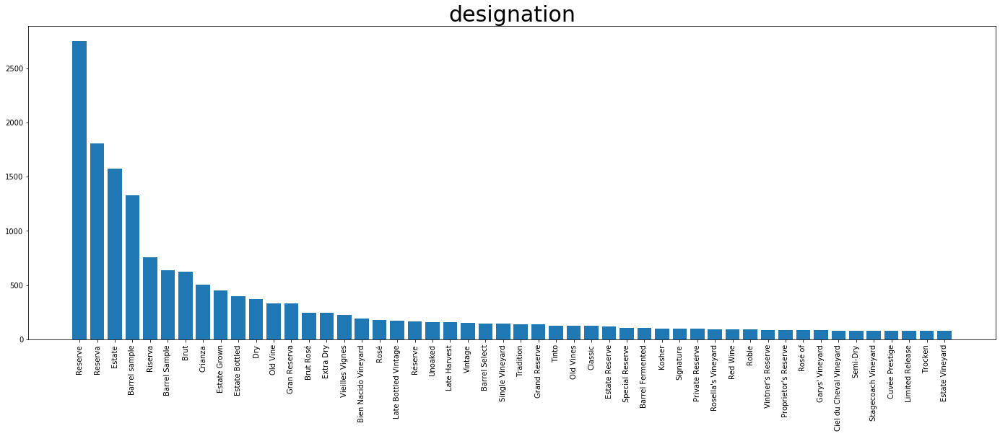

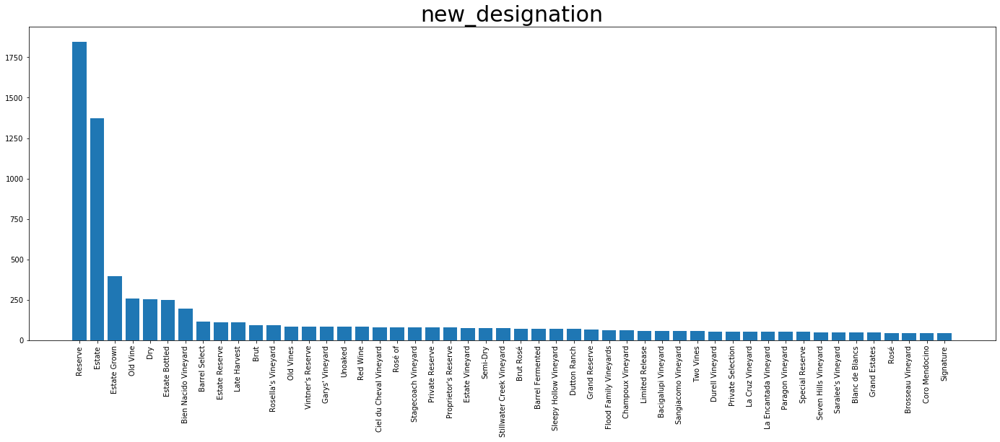

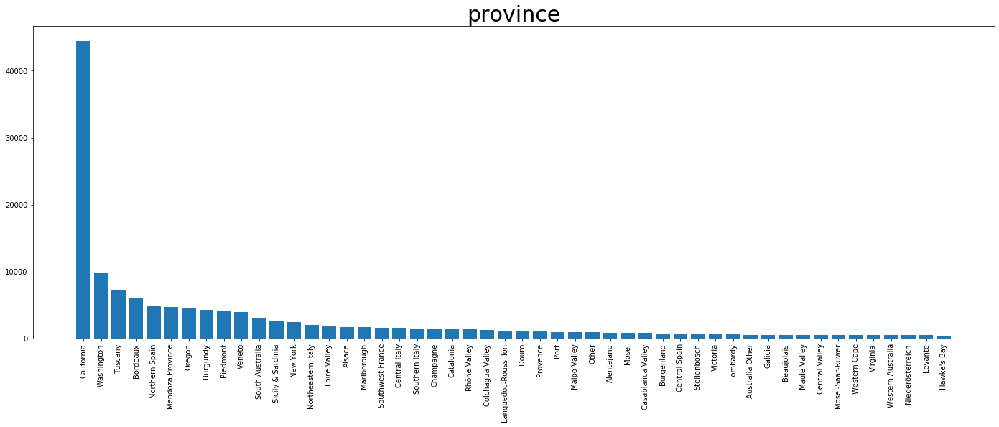

...

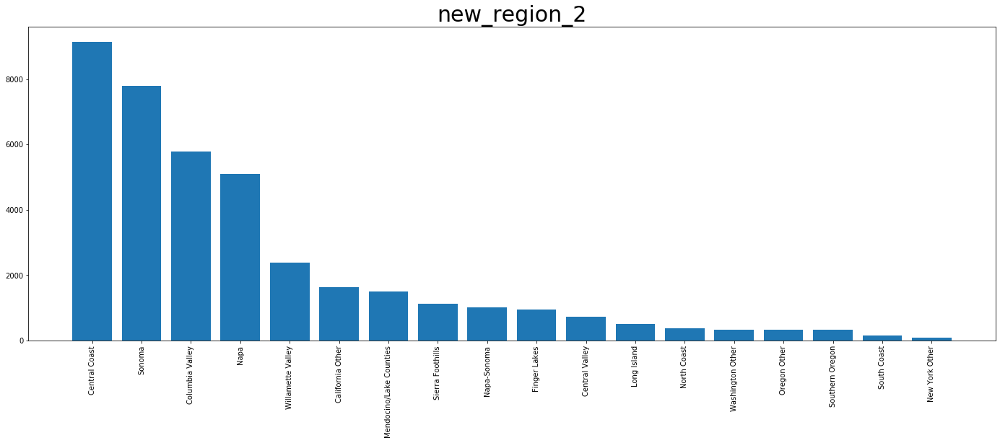

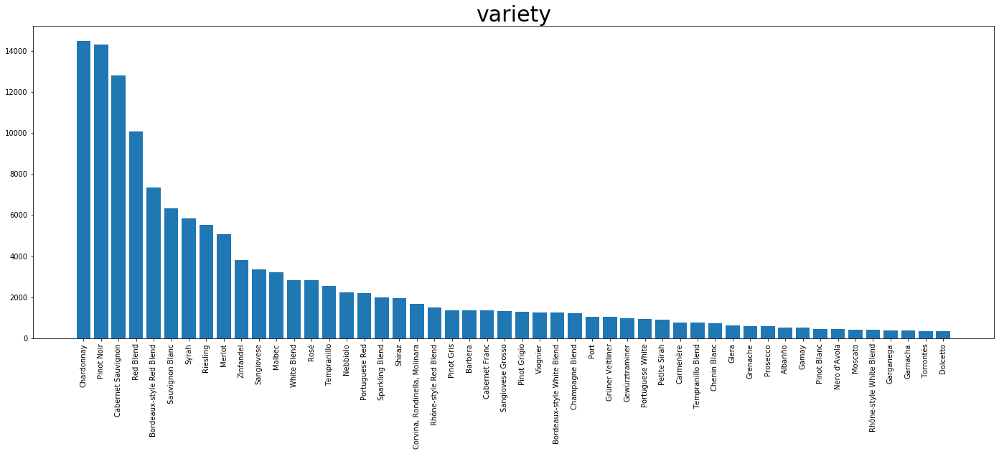

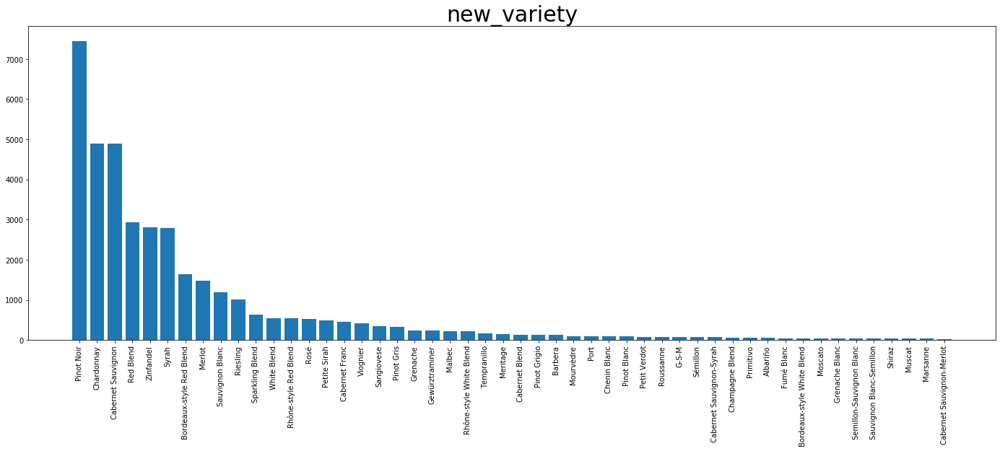

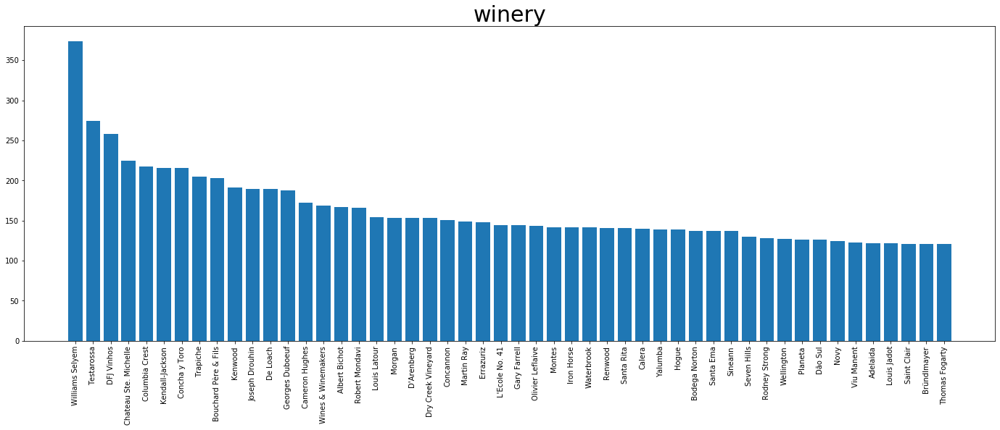

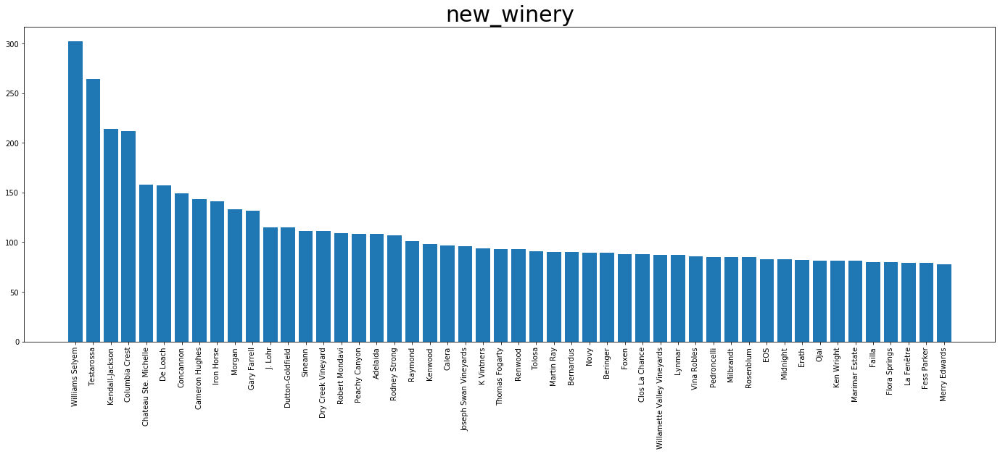

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
new Missing: 111689

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

new Min: 4.0000	Q1(25%): 22.0000 	Q2(50%): 32.0000 	Q3(75%): 45.0000 	Max: 2013.0000
new Missing: 111689



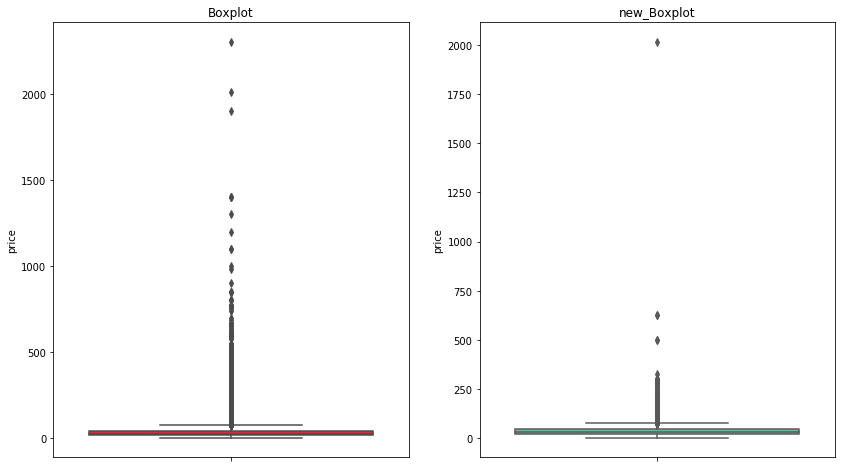

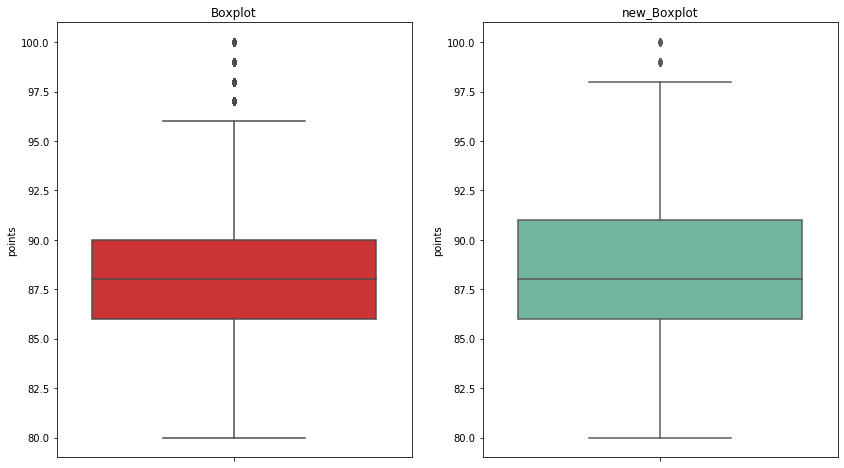

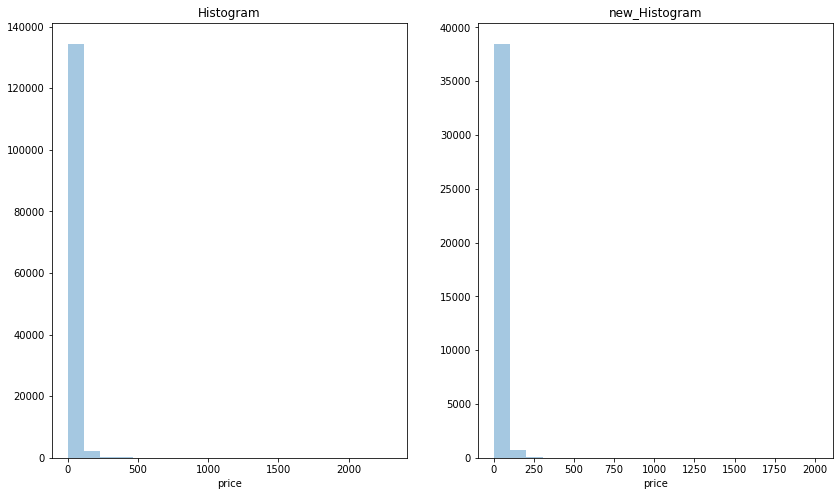

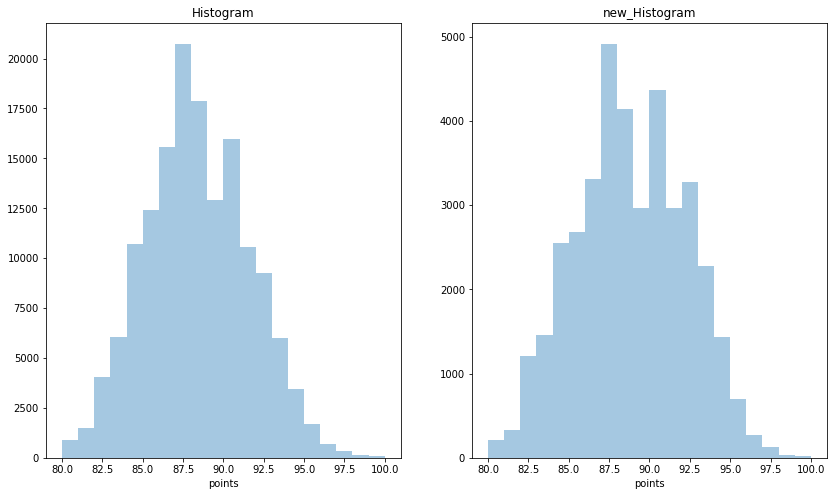

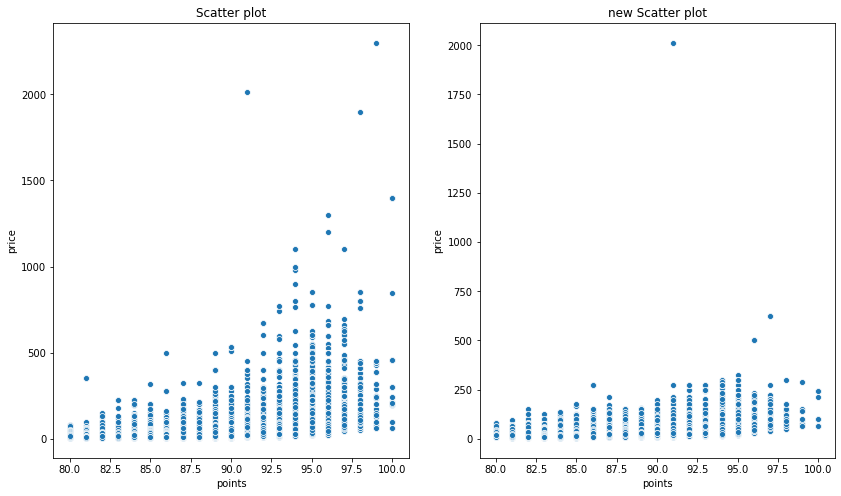

In [7]:
dw150k=miss_drop(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=dw150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=dw150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=dw150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=dw150k)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
country        150925 non-null object
description    150930 non-null object
designation    105195 non-null object
points         150930 non-null int64
price          137235 non-null float64
province       150925 non-null object
region_1       125870 non-null object
region_2       60953 non-null object
variety        150930 non-null object
winery         150930 non-null object
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
country        150930 non-null object
description    150930 non-null object
designation    150930 non-null object
points         150930 non-null int64
price          150930 non-null float64
province       150930 non-null object
region_1       150930 non-null object
region_2       150930 non-null object
variety      

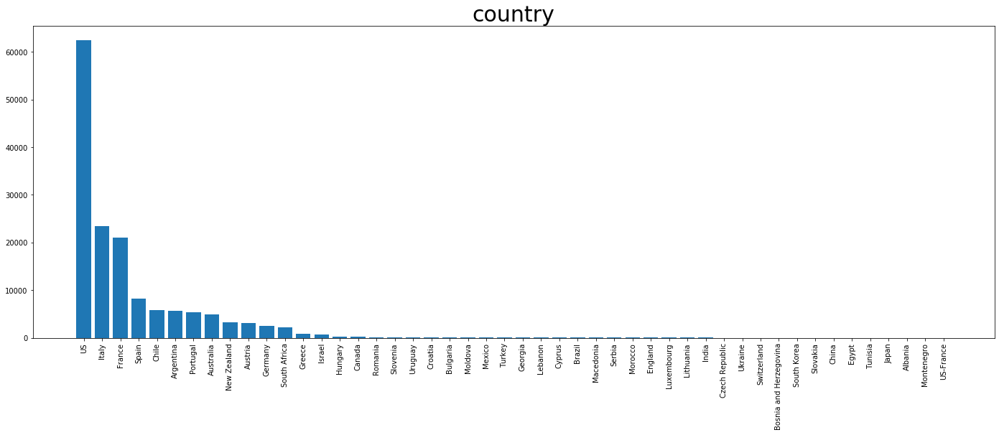

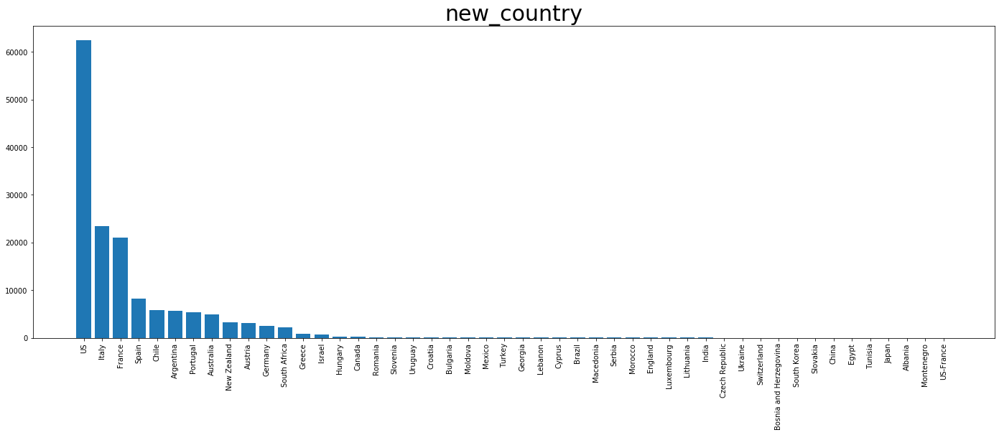

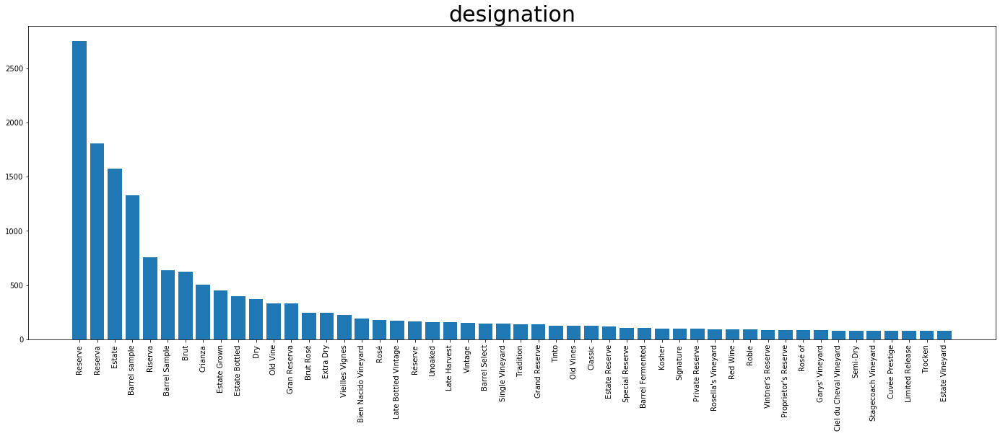

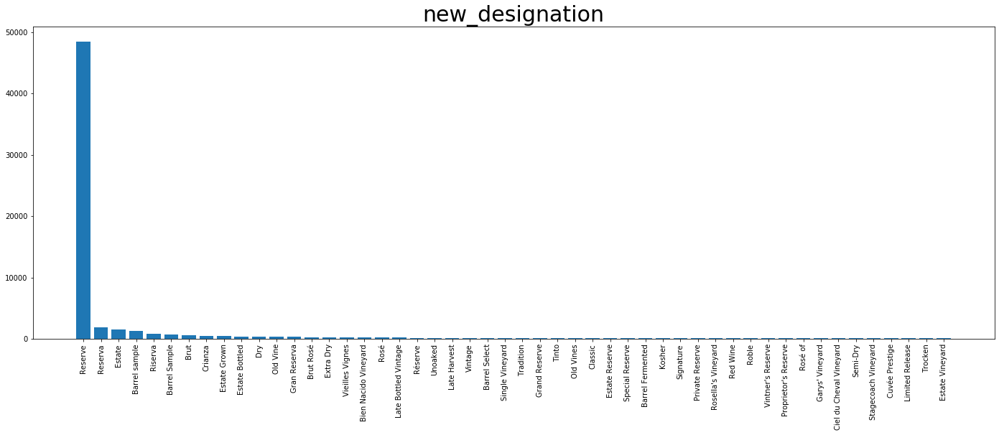

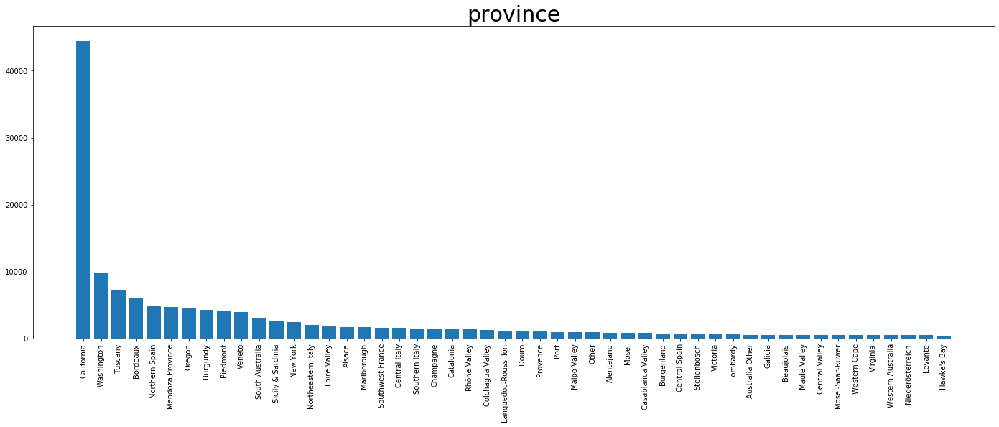

...

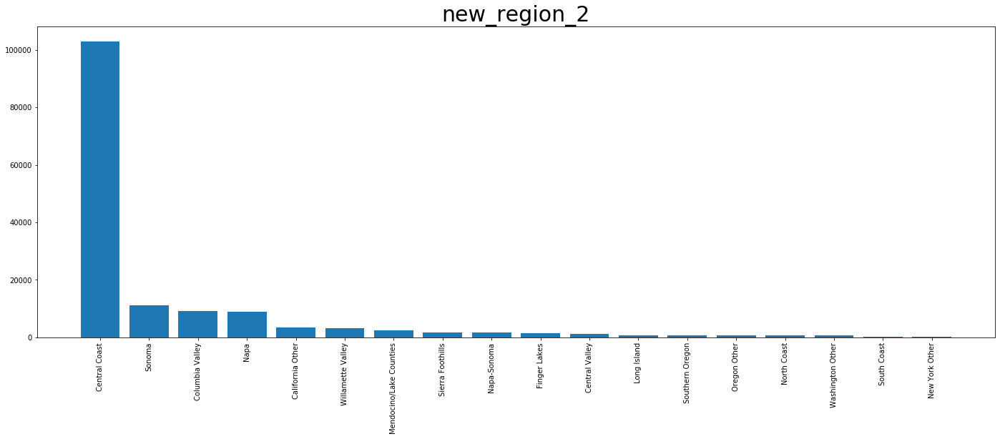

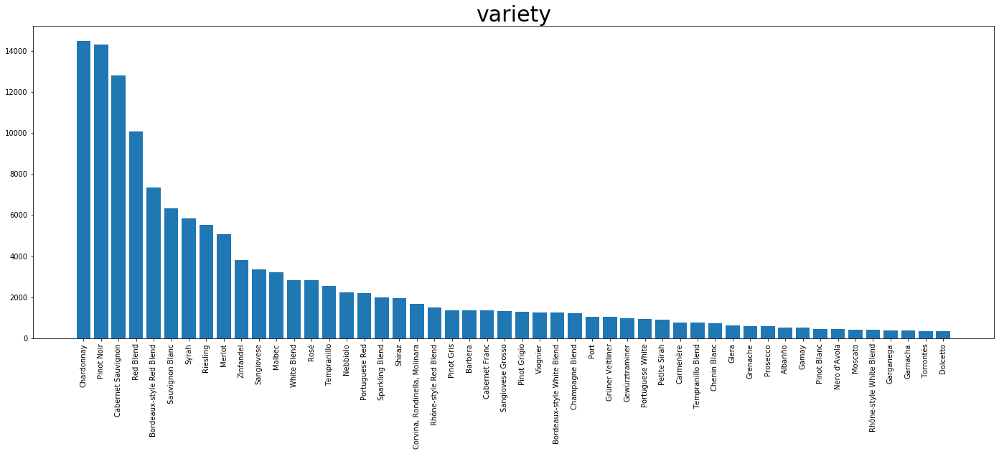

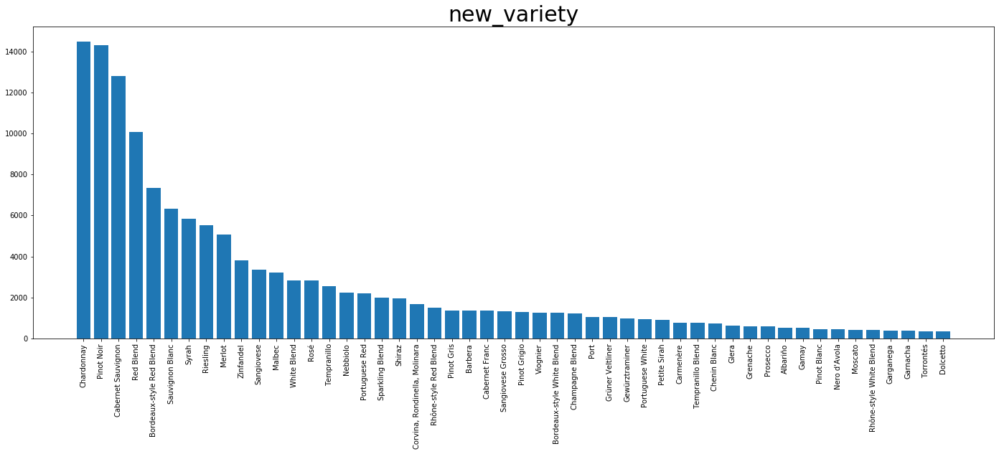

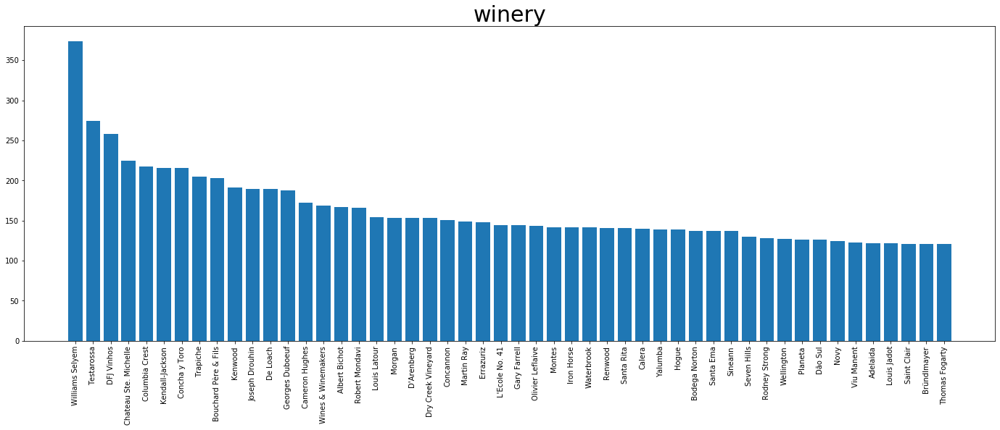

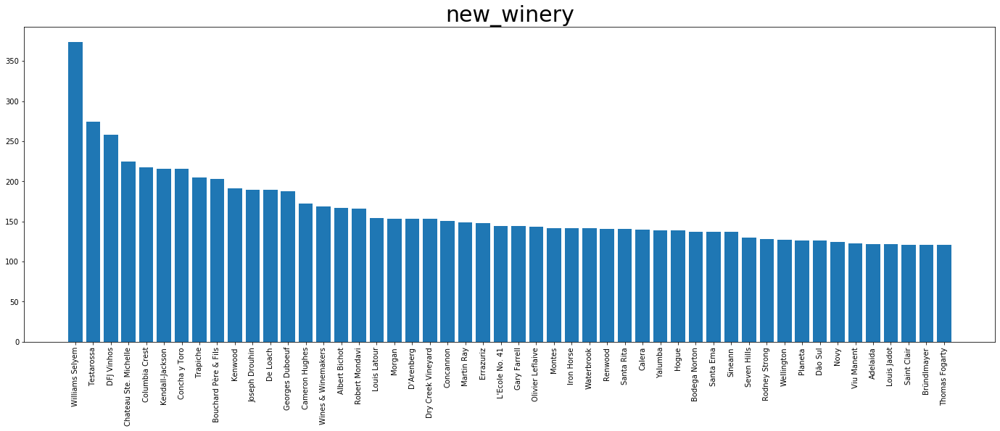

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
new Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 22.0000 	Q3(75%): 38.0000 	Max: 2300.0000
new Missing: 0



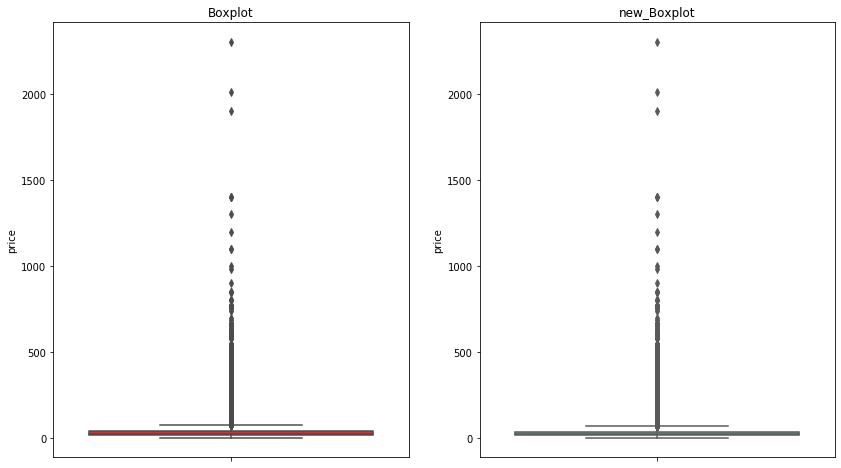

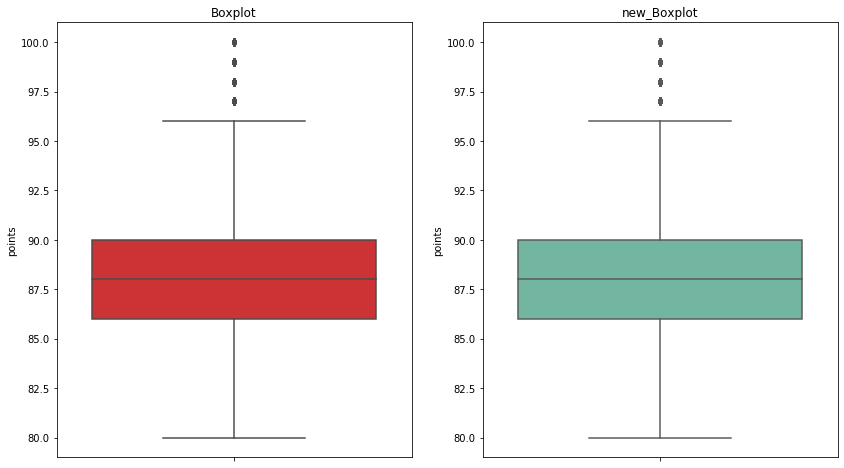

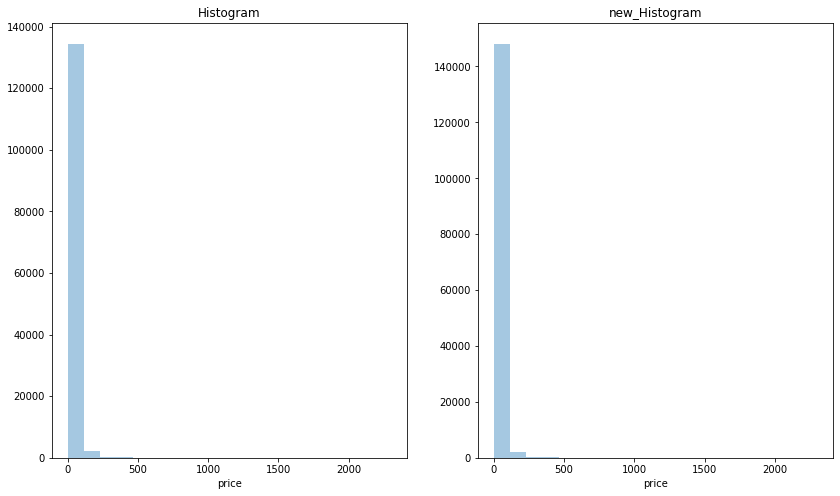

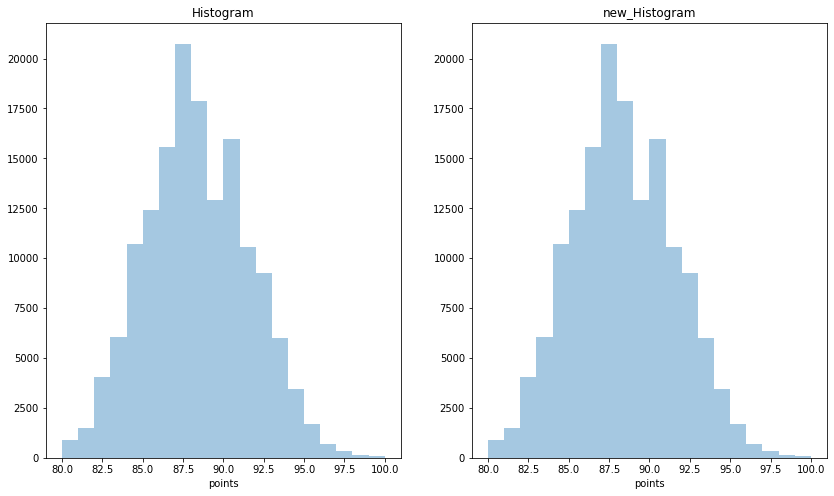

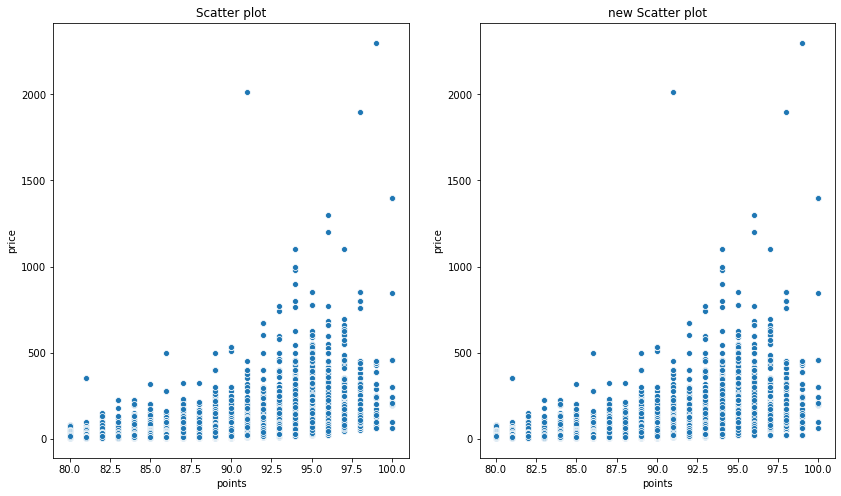

In [8]:
md150k=miss_mode_fill(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=md150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=md150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=md150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=md150k)

## winemag-data-130k-v2.csv

In [9]:
wine_reviews_dir = "/Users/wdaemon/Downloads/wine-reviews"
winemag130k=pd.read_csv(wine_reviews_dir+"/winemag-data-130k-v2.csv",sep=',',header='infer',index_col=0)
columns_info(winemag130k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
country                  129908 non-null object
description              129971 non-null object
designation              92506 non-null object
points                   129971 non-null int64
price                    120975 non-null float64
province                 129908 non-null object
region_1                 108724 non-null object
region_2                 50511 non-null object
taster_name              103727 non-null object
taster_twitter_handle    98758 non-null object
title                    129971 non-null object
variety                  129970 non-null object
winery                   129971 non-null object
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)


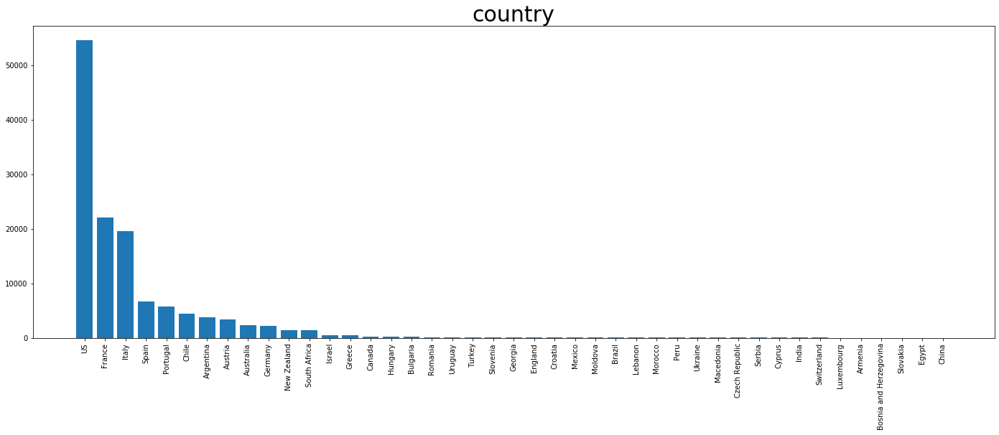

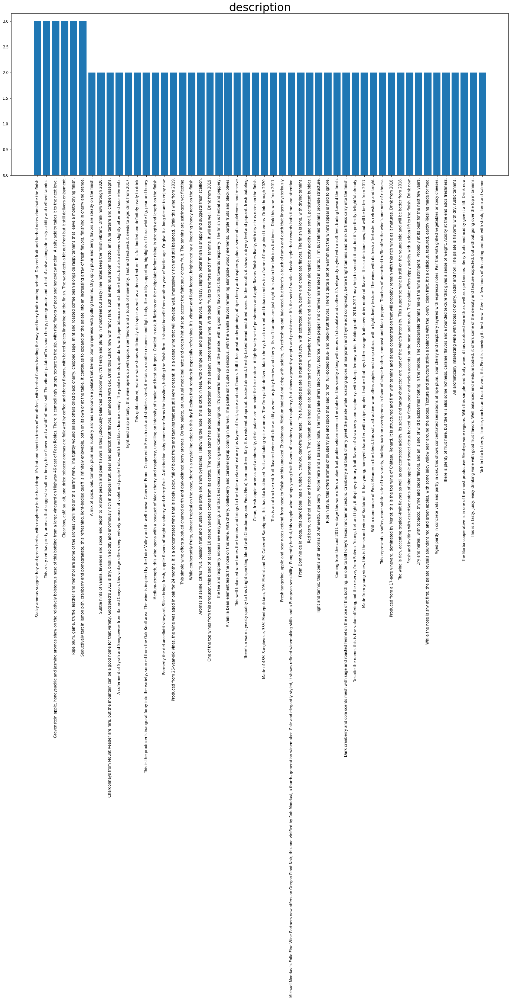

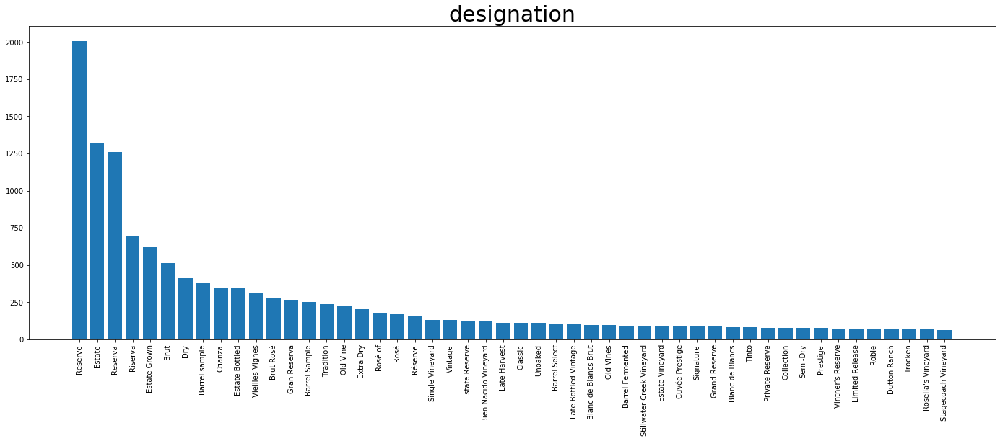

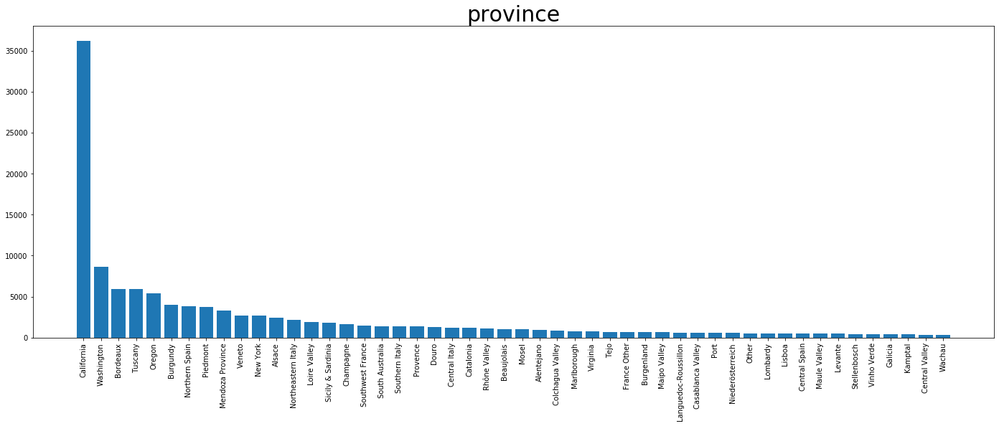

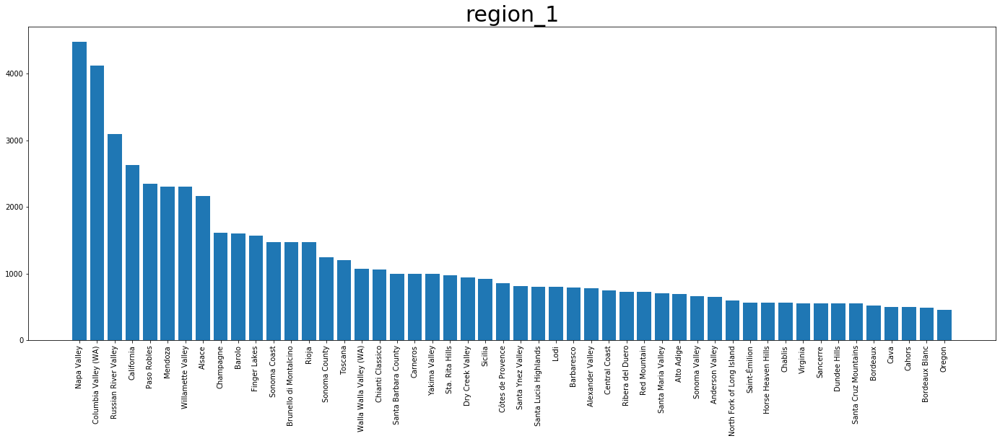

...

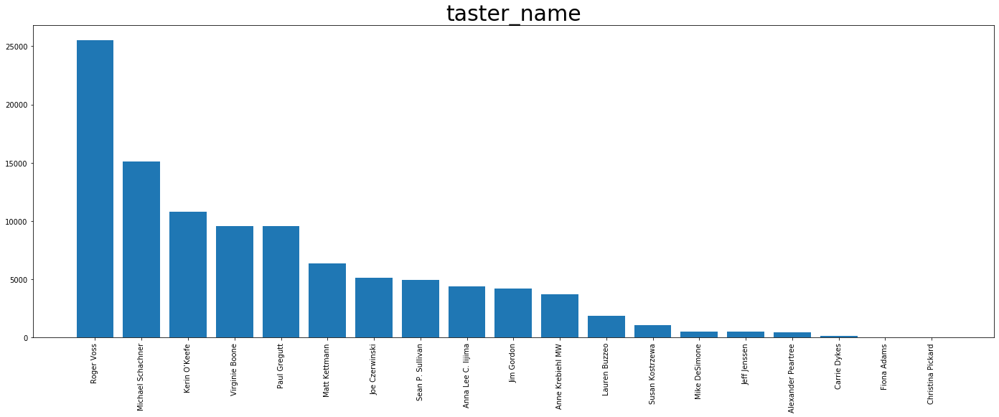

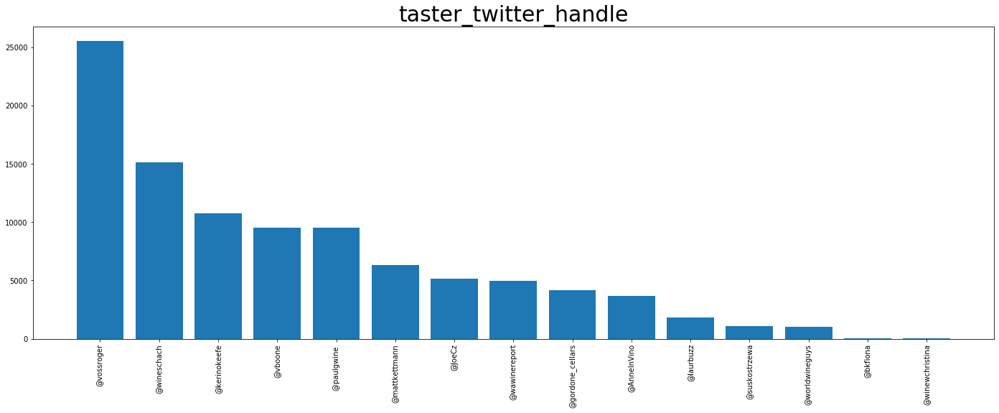

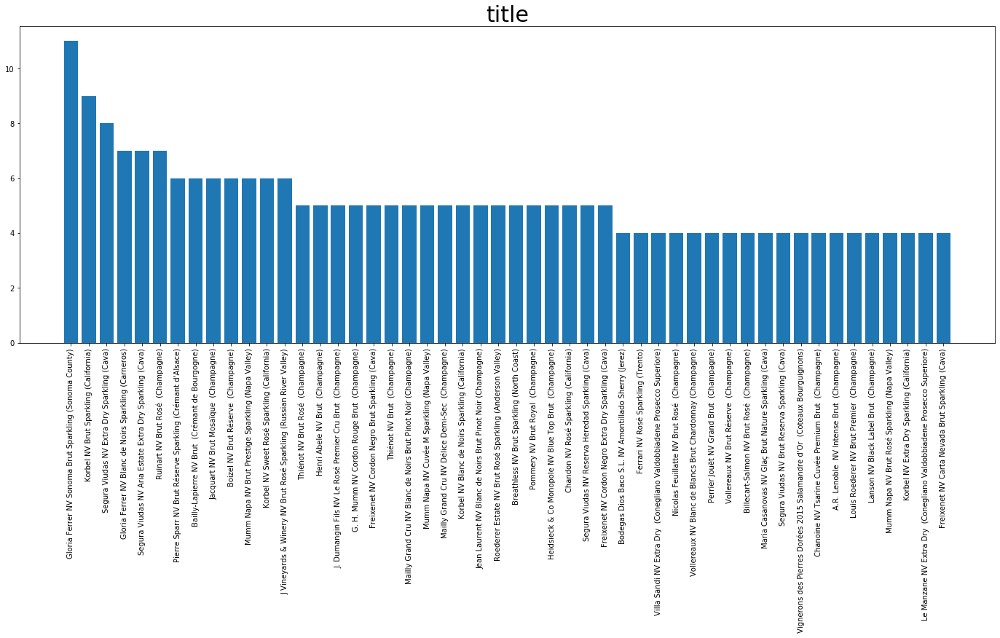

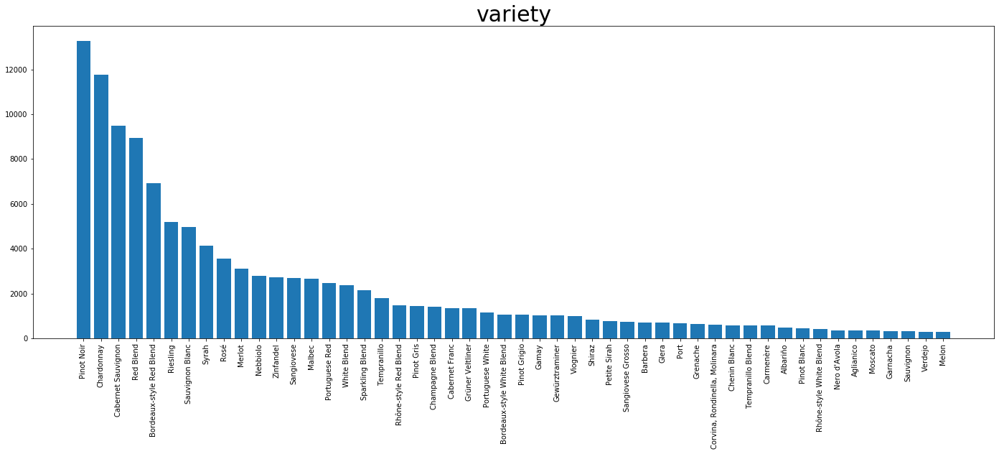

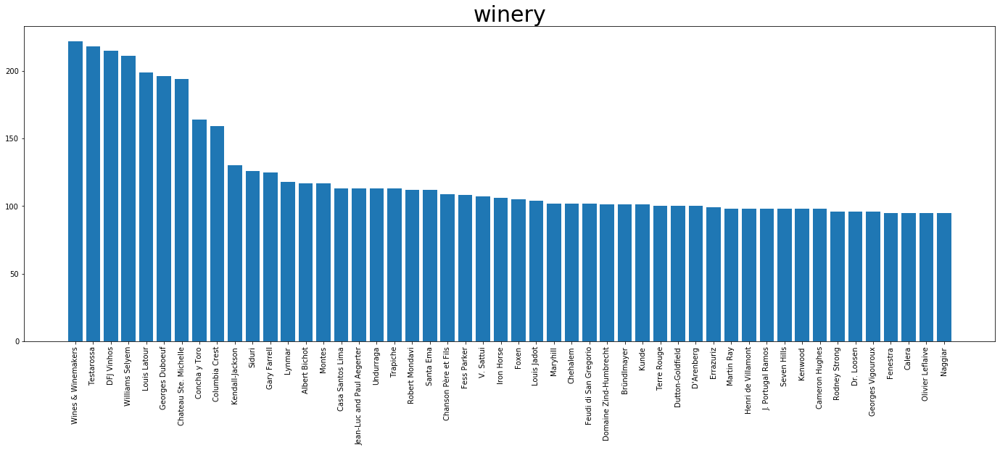

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996



In [10]:
# Nominal index
nominal_index = ['country','description', 'designation', 'province', 'region_1', 'region_2', 
                 'taster_name','taster_twitter_handle','title',
                 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag130k,nominal_index,head_n=50)
numerical_summary(winemag130k,numerical_index)

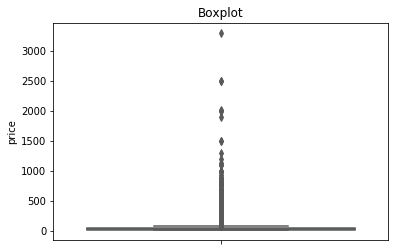

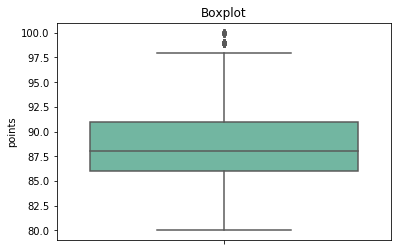

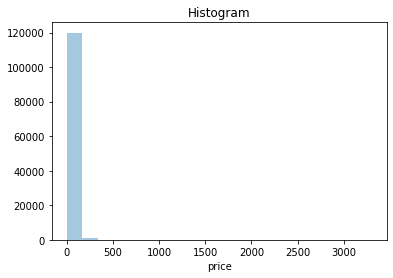

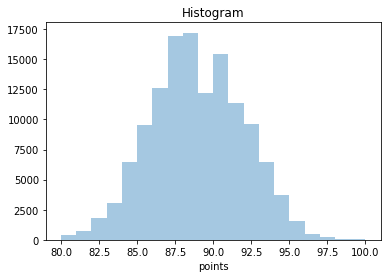

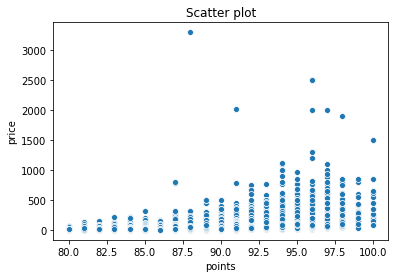

In [11]:
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
country                  129908 non-null object
description              129971 non-null object
designation              92506 non-null object
points                   129971 non-null int64
price                    120975 non-null float64
province                 129908 non-null object
region_1                 108724 non-null object
region_2                 50511 non-null object
taster_name              103727 non-null object
taster_twitter_handle    98758 non-null object
title                    129971 non-null object
variety                  129970 non-null object
winery                   129971 non-null object
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22387 entries, 4 to 129950
Data columns (total 13 columns):
country                  22387 non-null object
description              223

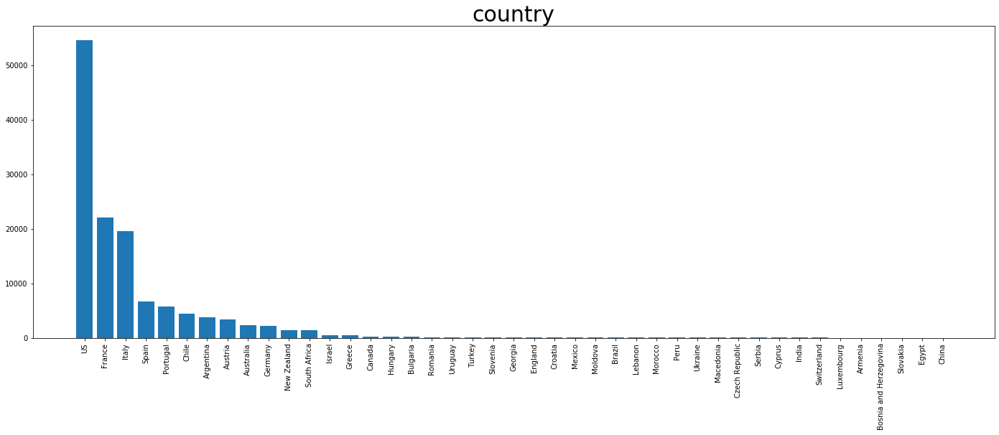

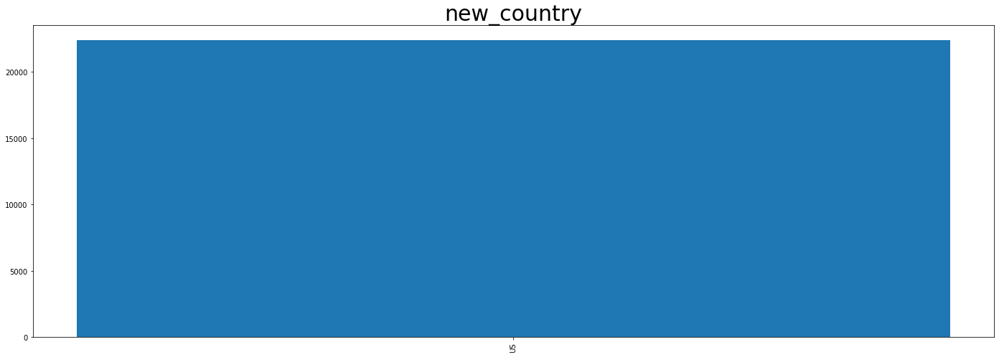

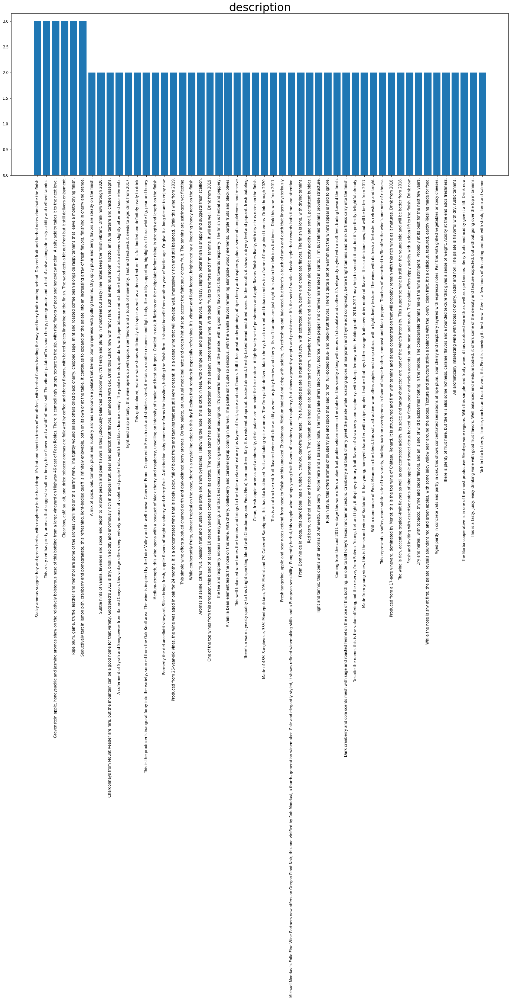

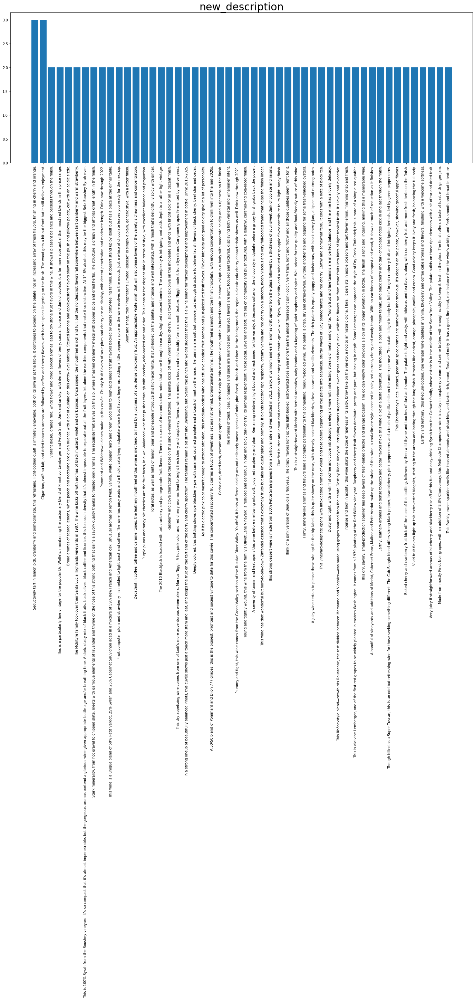

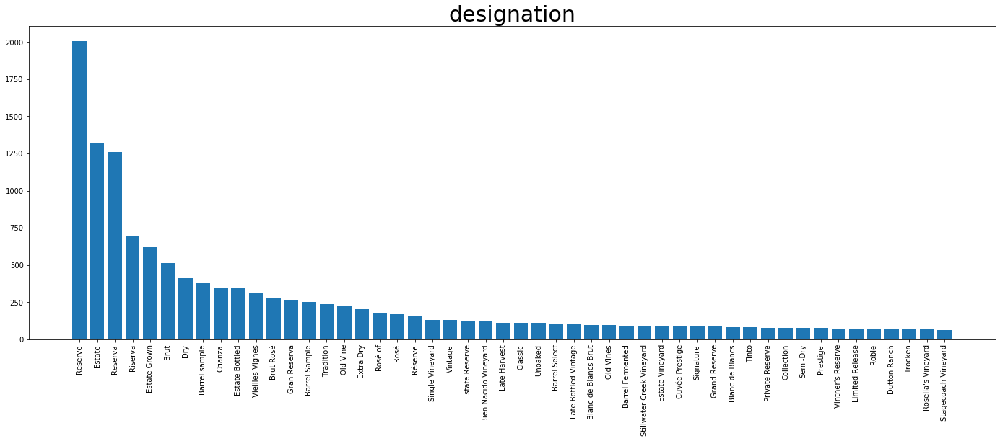

...

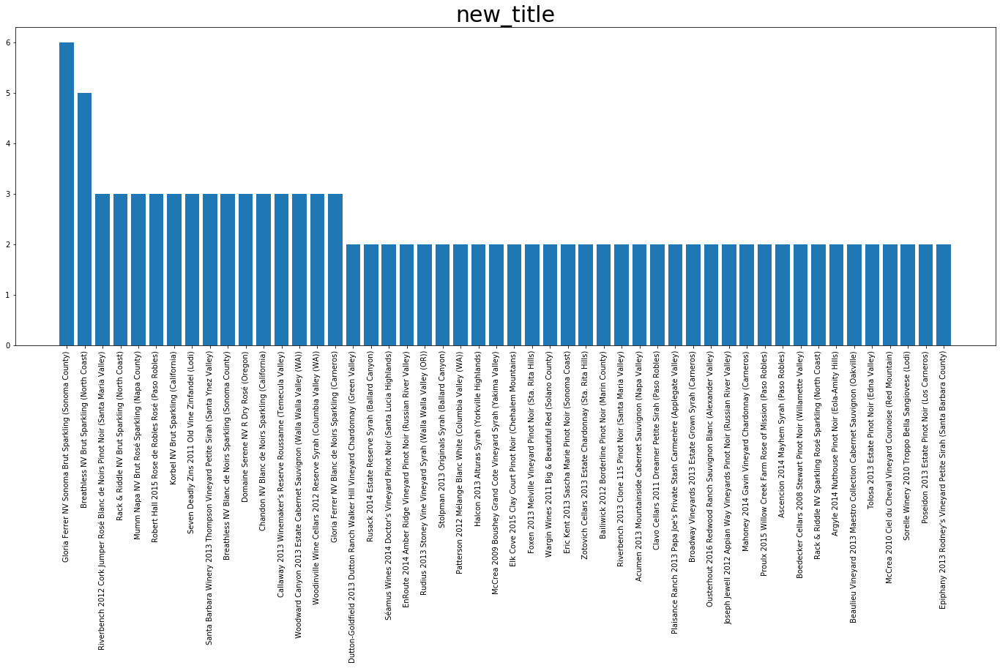

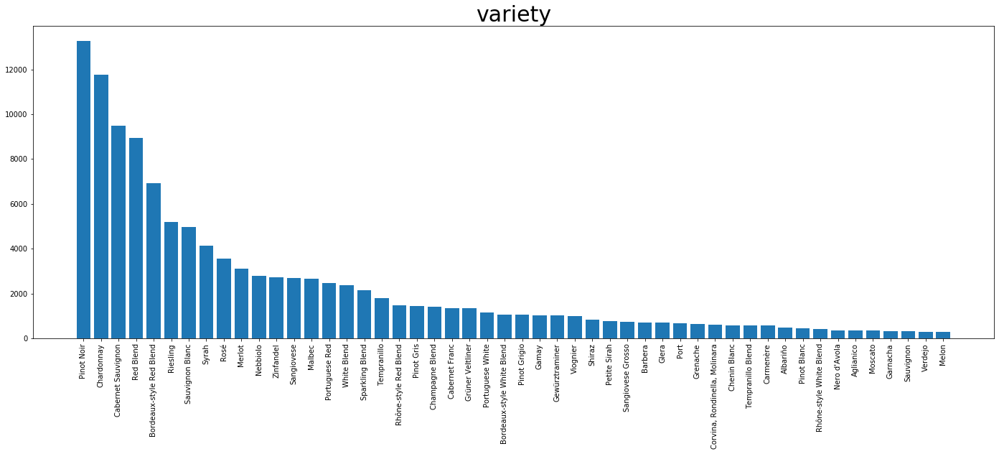

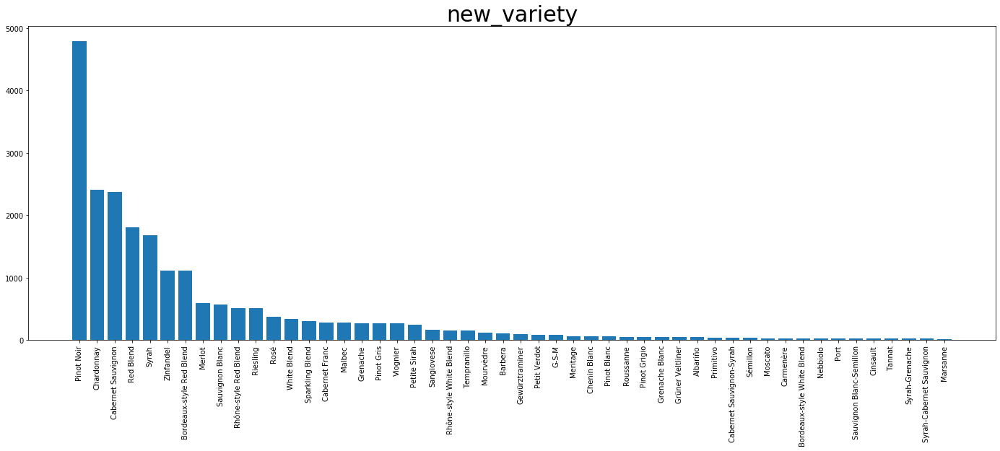

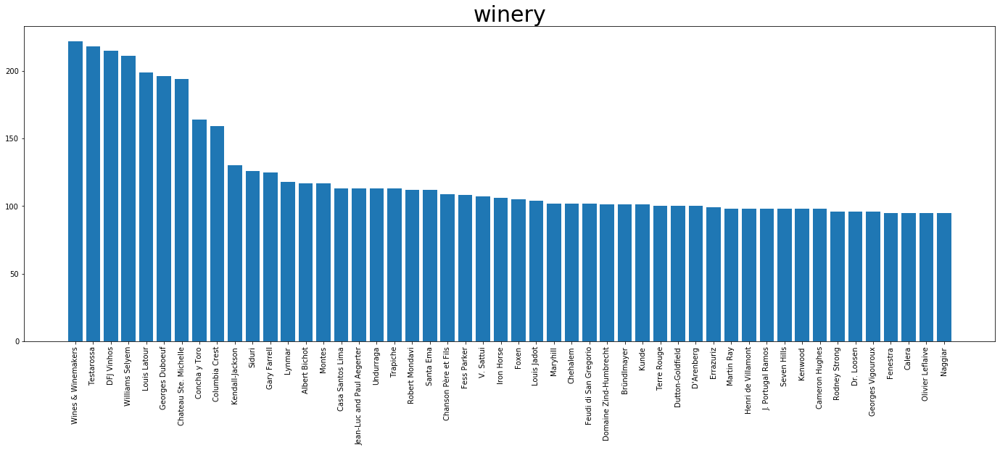

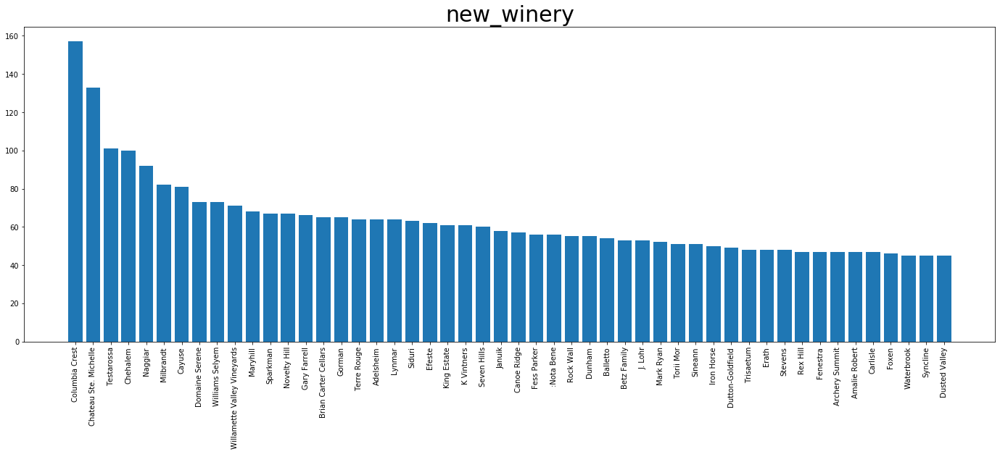

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

new Min: 80.0000	Q1(25%): 88.0000 	Q2(50%): 90.0000 	Q3(75%): 92.0000 	Max: 100.0000
new Missing: 107584

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

new Min: 4.0000	Q1(25%): 25.0000 	Q2(50%): 36.0000 	Q3(75%): 50.0000 	Max: 2013.0000
new Missing: 107584



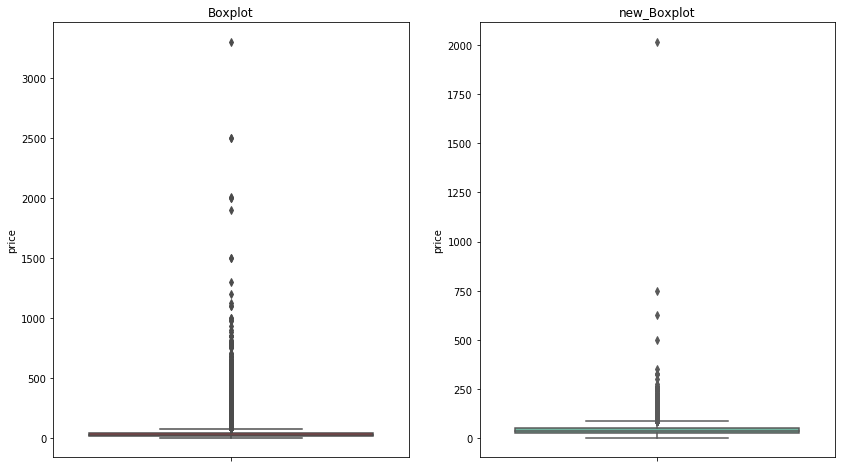

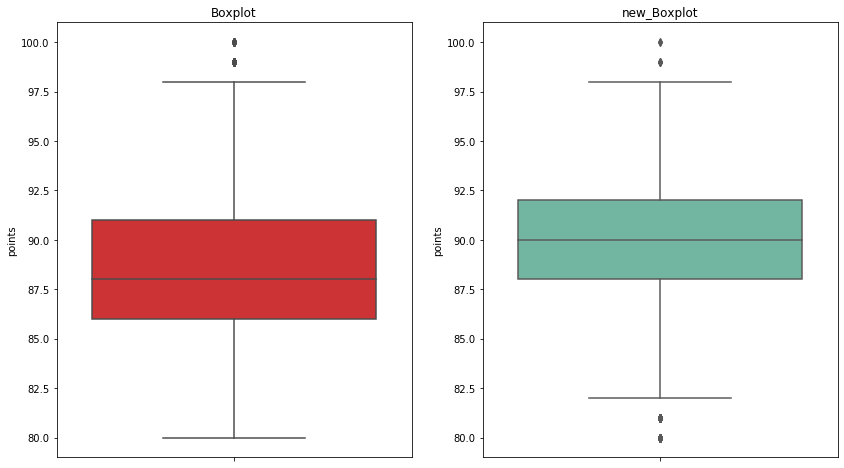

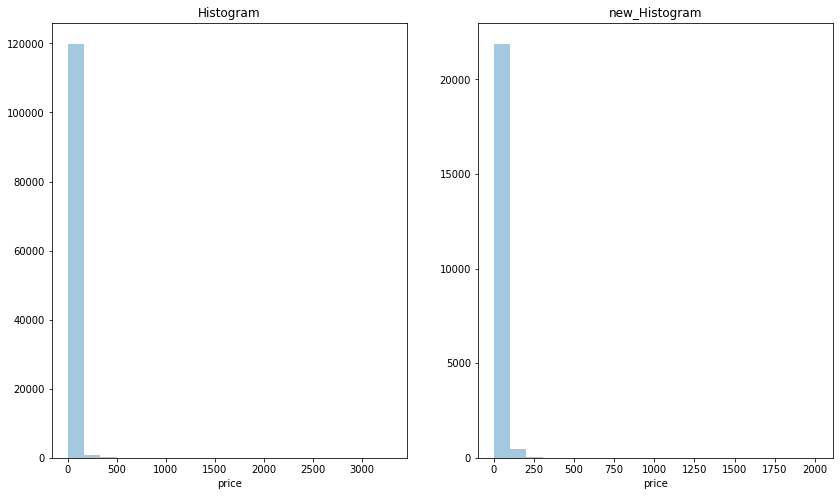

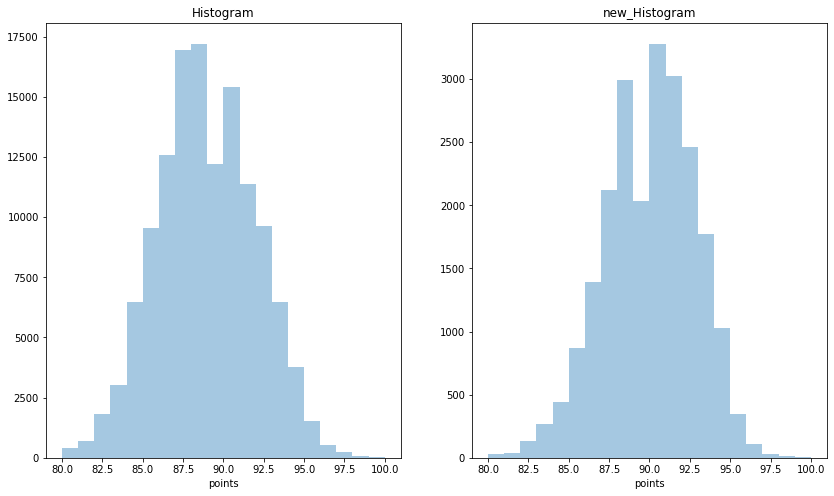

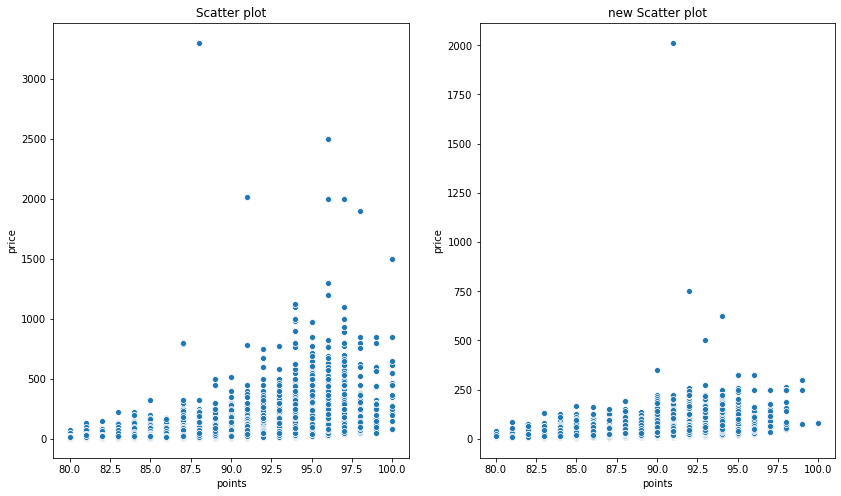

In [12]:
dw130k=miss_drop(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=dw130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=dw130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=dw130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=dw130k)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
country                  129908 non-null object
description              129971 non-null object
designation              92506 non-null object
points                   129971 non-null int64
price                    120975 non-null float64
province                 129908 non-null object
region_1                 108724 non-null object
region_2                 50511 non-null object
taster_name              103727 non-null object
taster_twitter_handle    98758 non-null object
title                    129971 non-null object
variety                  129970 non-null object
winery                   129971 non-null object
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
country                  129971 non-null object
description              1

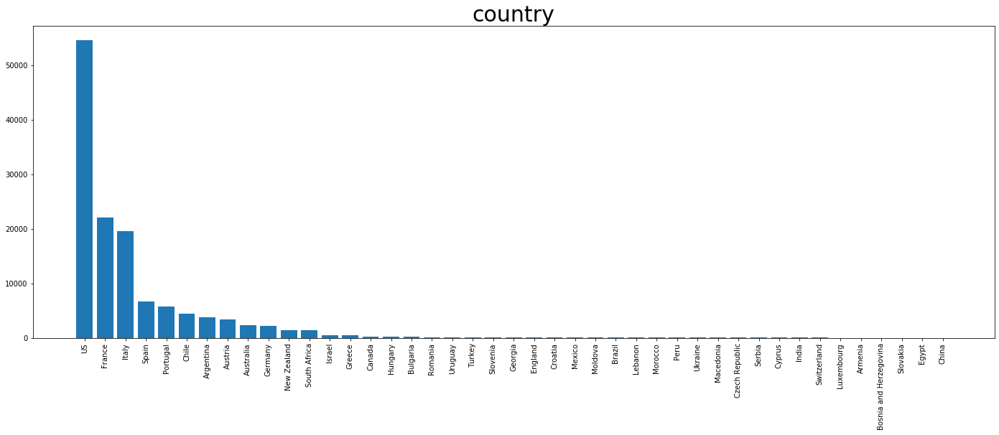

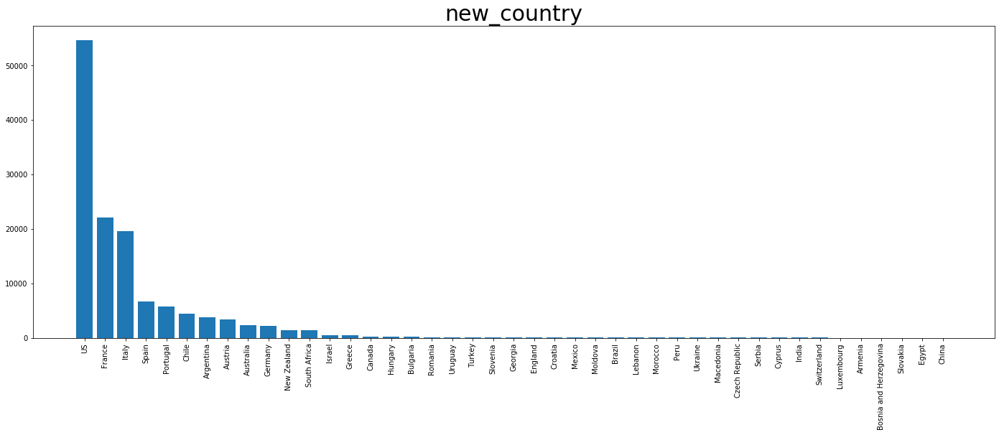

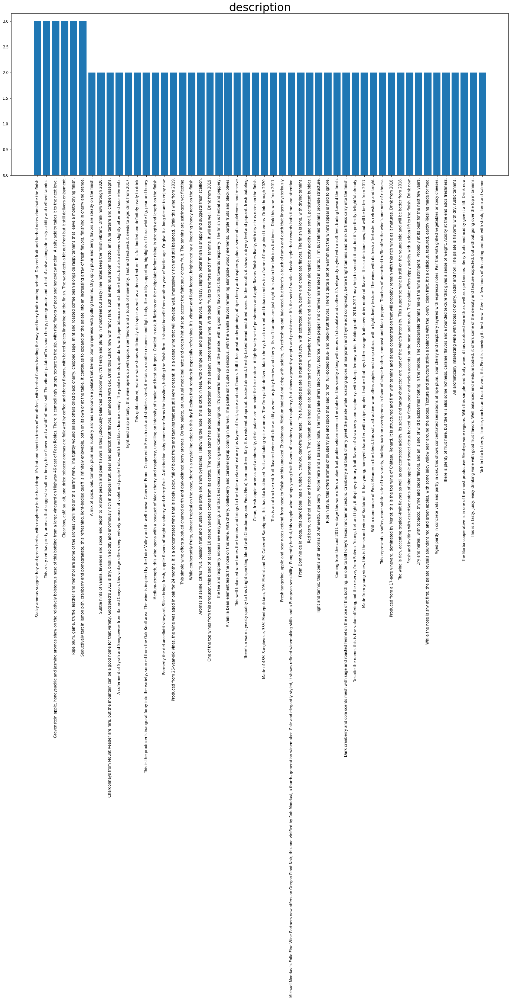

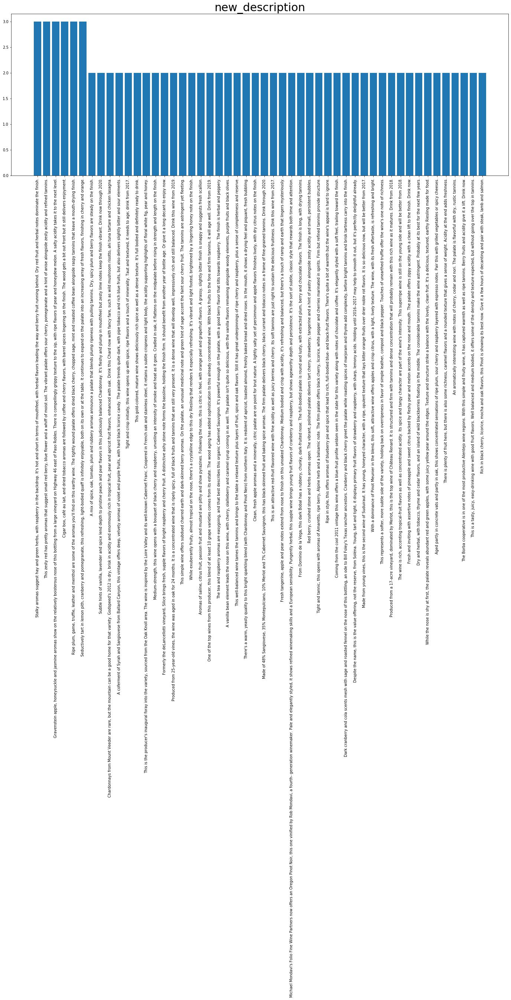

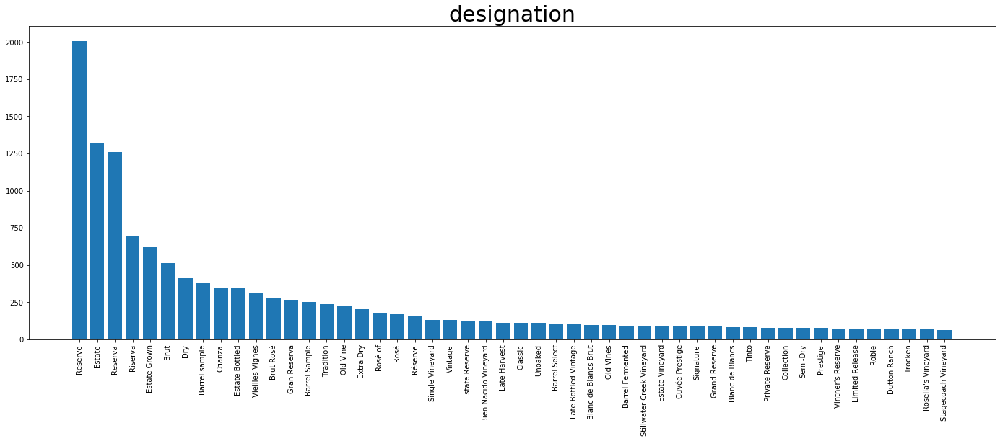

...

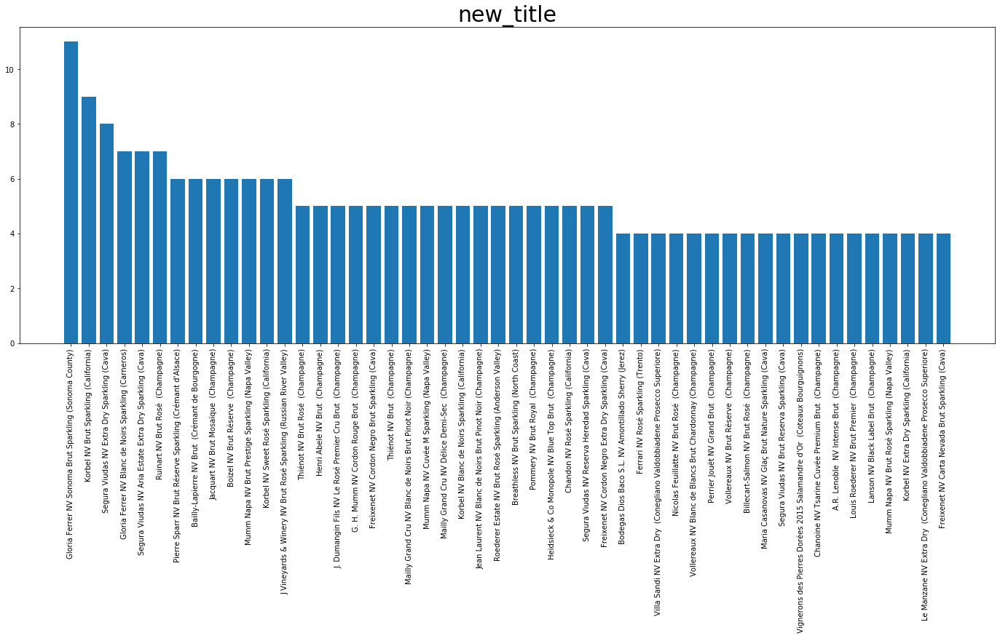

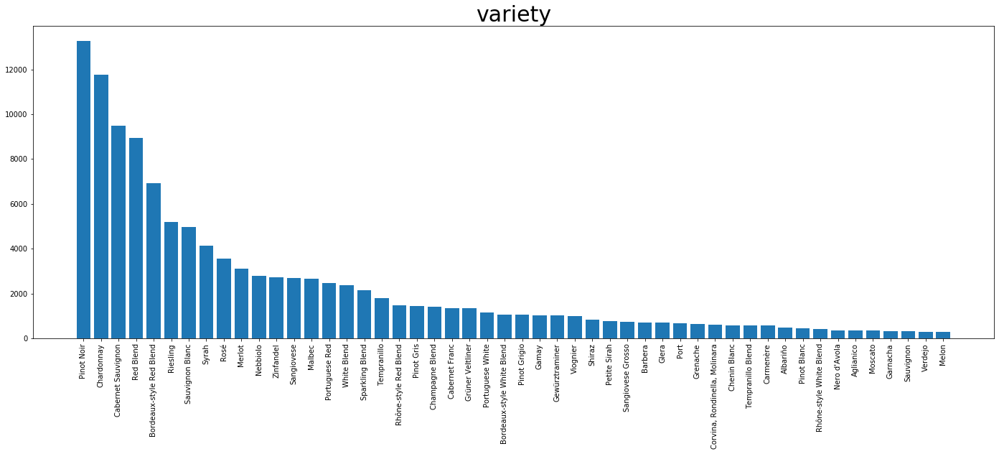

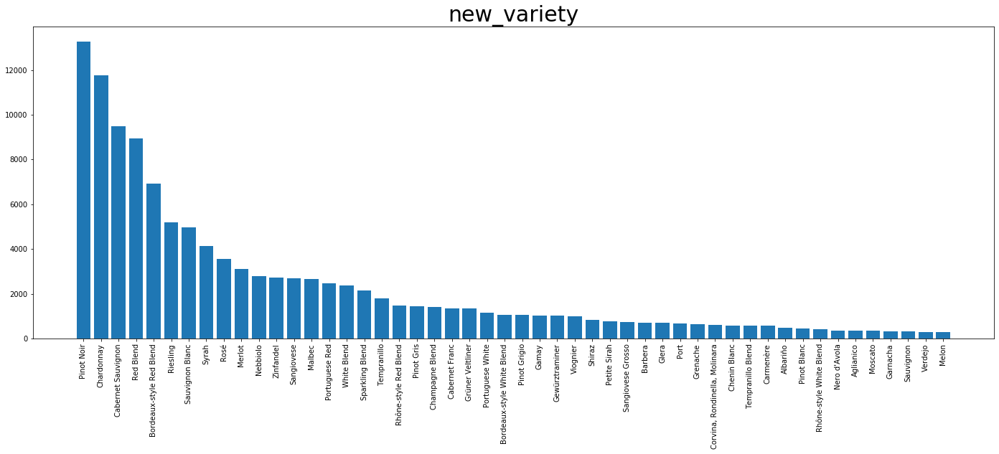

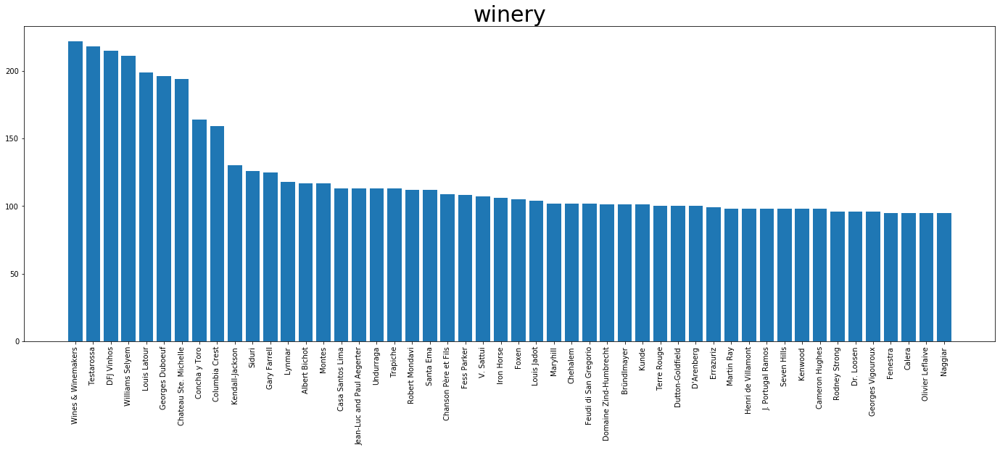

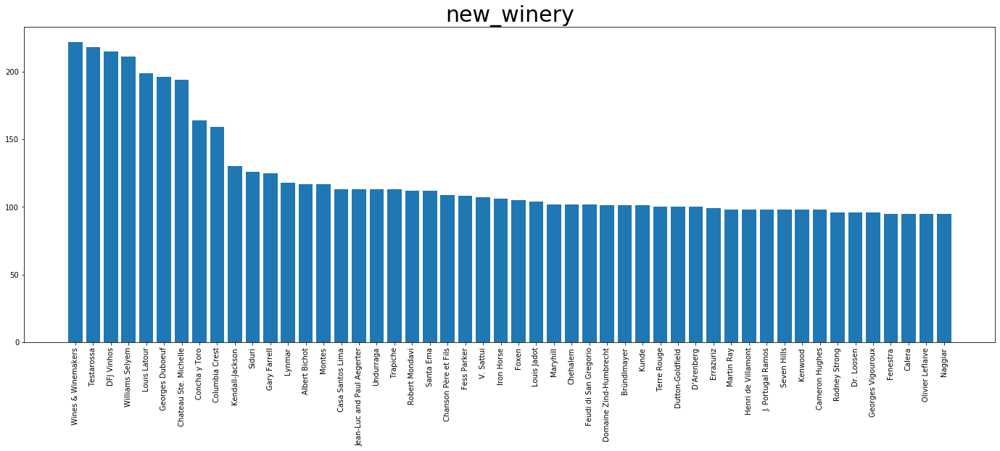

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
new Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

new Min: 4.0000	Q1(25%): 18.0000 	Q2(50%): 25.0000 	Q3(75%): 40.0000 	Max: 3300.0000
new Missing: 0



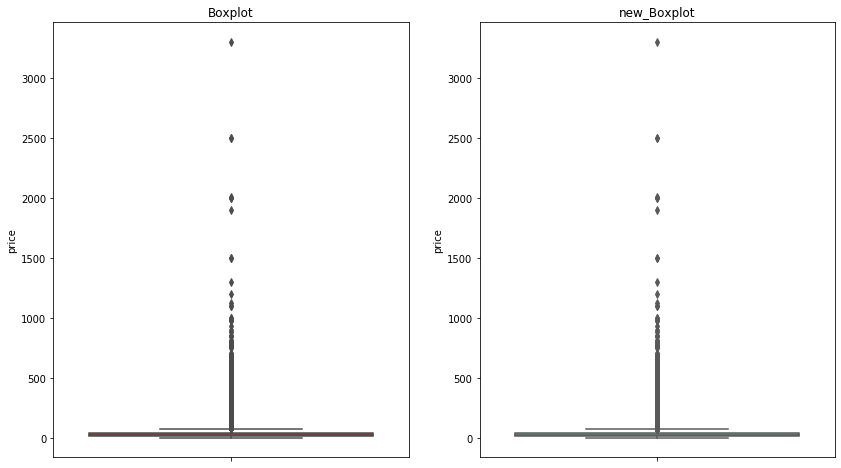

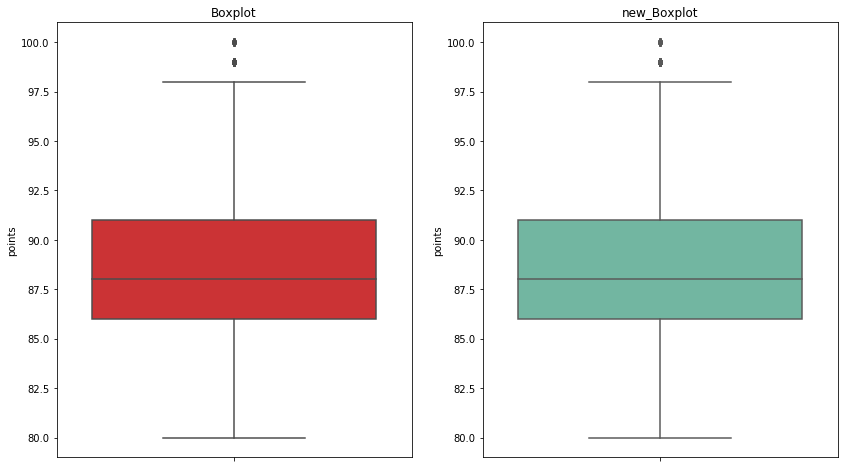

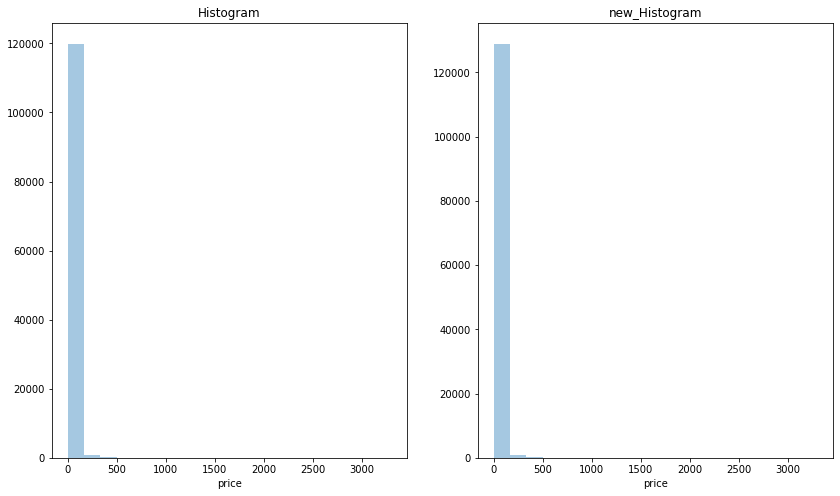

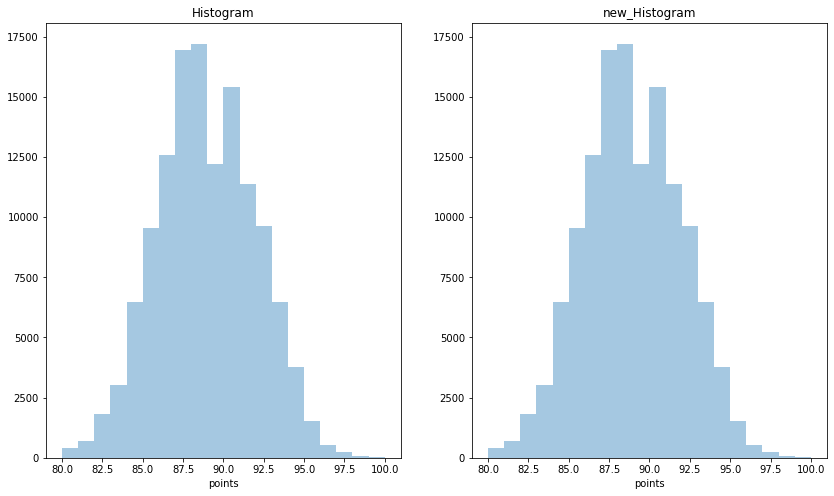

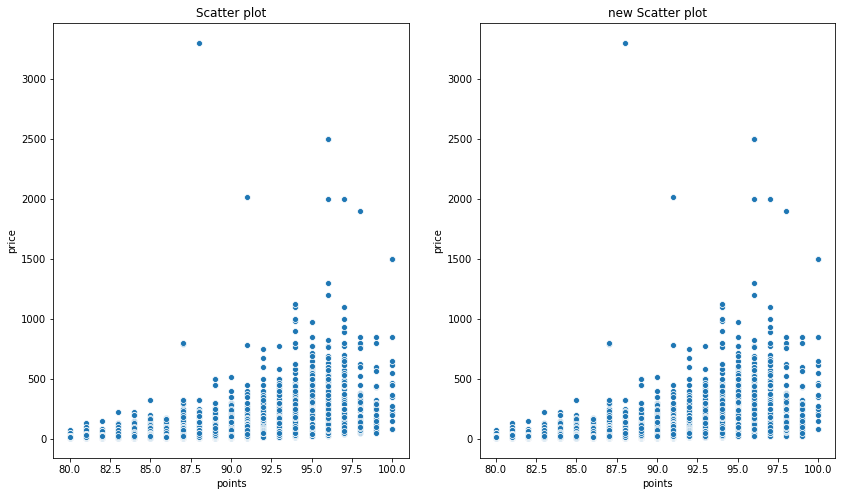

In [13]:
md130k=miss_mode_fill(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=md130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=md130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=md130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=md130k)

# 数据集2 - Consumer & Visitor Insights For Neighborhoods
Consumer Insights & Visitation Data At The Census Block Group Level
> cbg_patterns.csv Census Block Group Visitor Patterns & Consumer Insights.

## cbg_patterns.csv

In [14]:
cbg_patterns_dir = "~/Downloads"
cbg_patterns=pd.read_csv(cbg_patterns_dir+"/cbg_patterns.csv",sep=',',header='infer',index_col=0)

In [15]:
columns_info(cbg_patterns)

<class 'pandas.core.frame.DataFrame'>
Float64Index: 220735 entries, 10059508001.0 to nan
Data columns (total 12 columns):
date_range_start            220735 non-null int64
date_range_end              220735 non-null int64
raw_visit_count             220629 non-null float64
raw_visitor_count           220629 non-null float64
visitor_home_cbgs           220735 non-null object
visitor_work_cbgs           220735 non-null object
distance_from_home          220518 non-null float64
related_same_day_brand      220735 non-null object
related_same_month_brand    220735 non-null object
top_brands                  220735 non-null object
popularity_by_hour          220735 non-null object
popularity_by_day           220735 non-null object
dtypes: float64(3), int64(2), object(7)
memory usage: 21.9+ MB
None
(220735, 12)


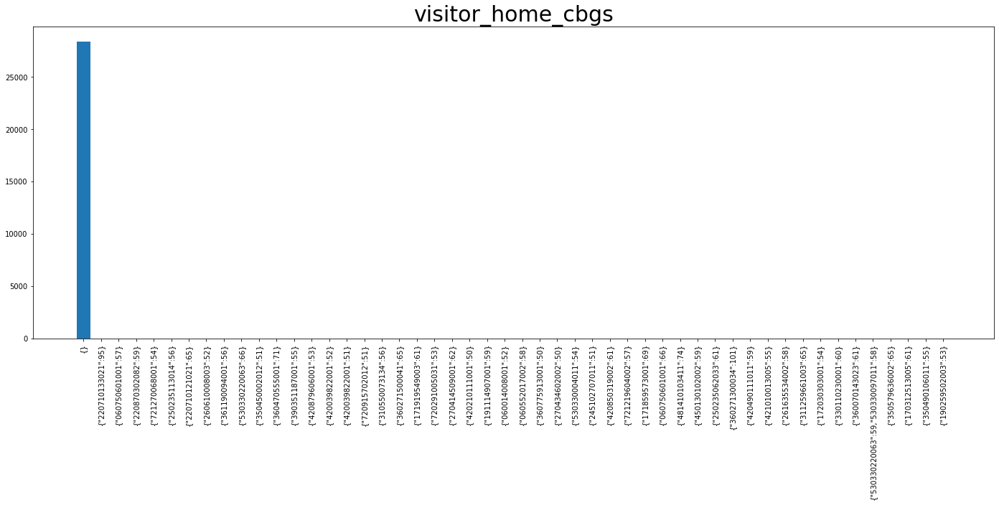

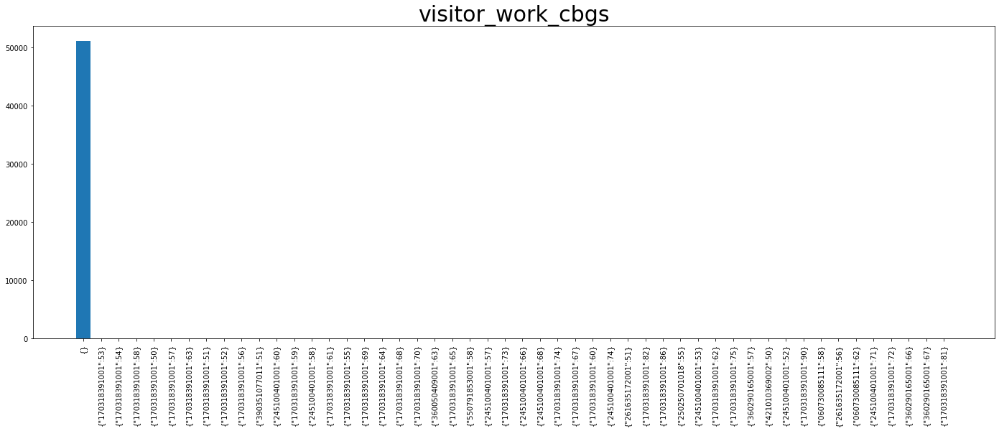

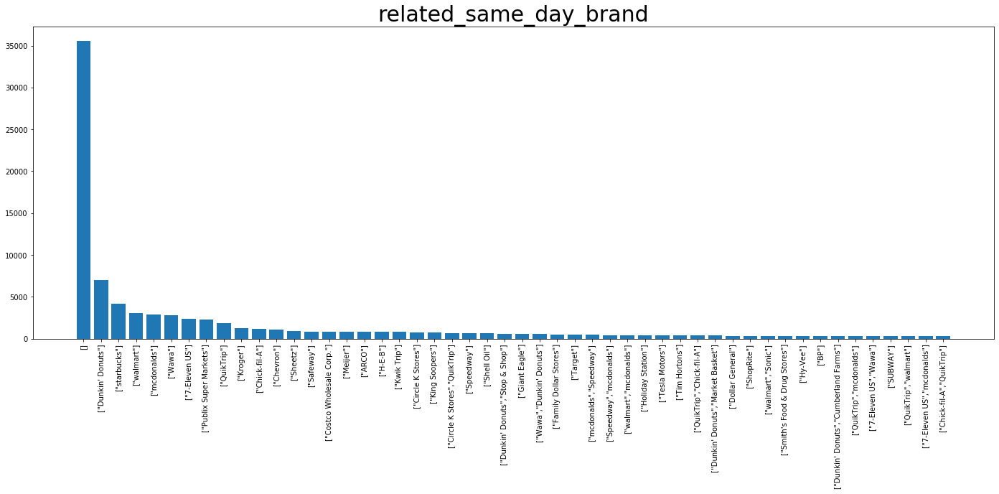

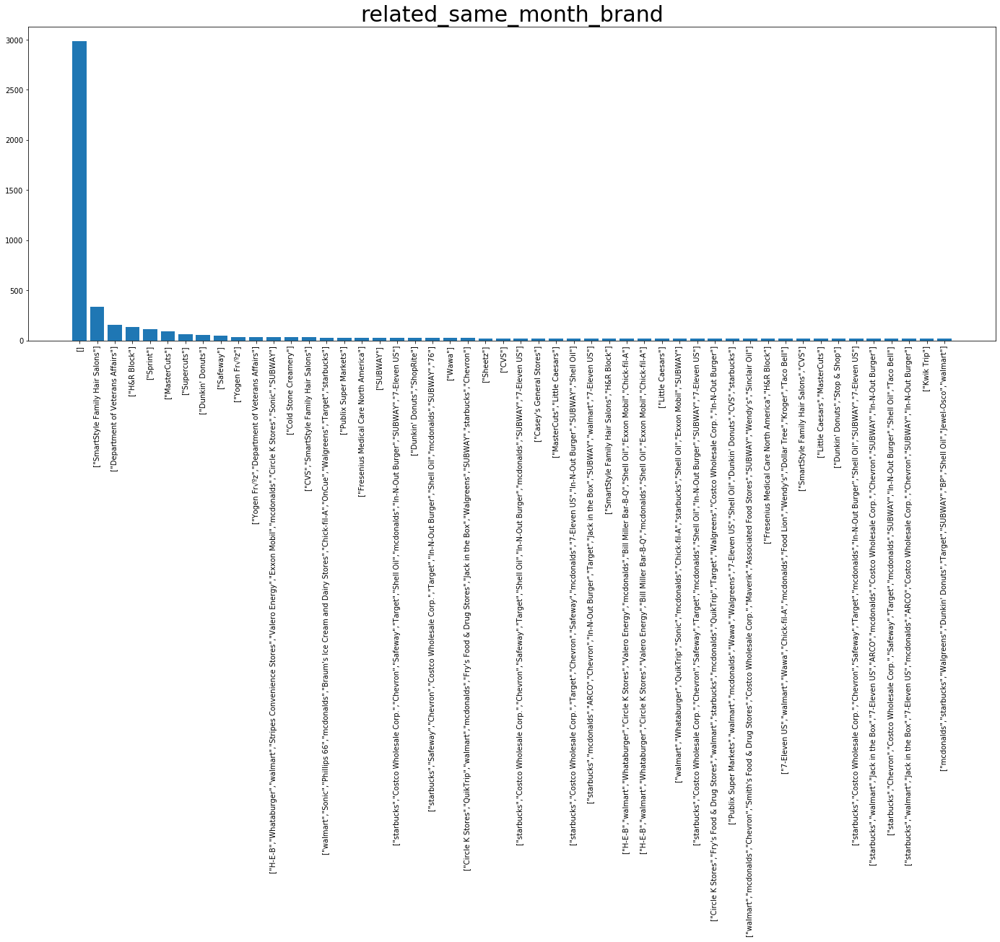

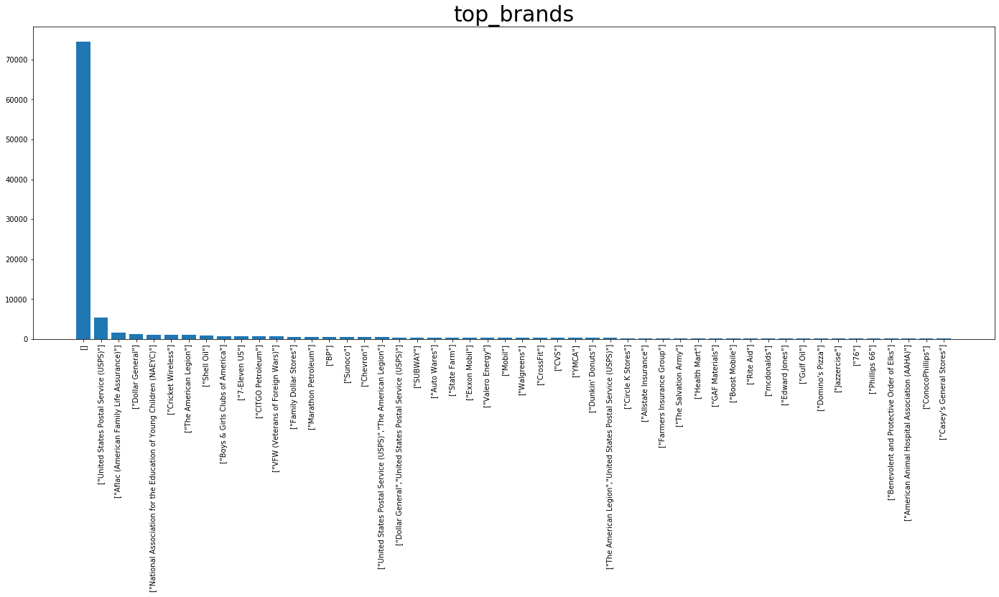

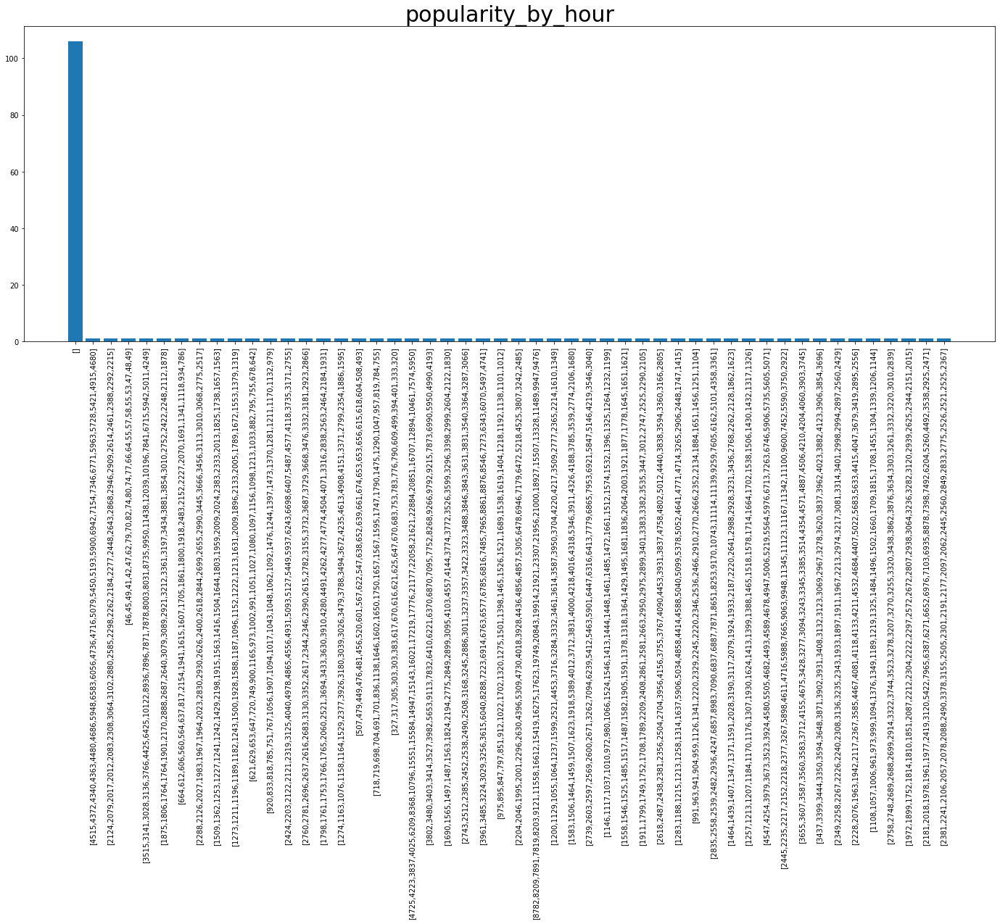

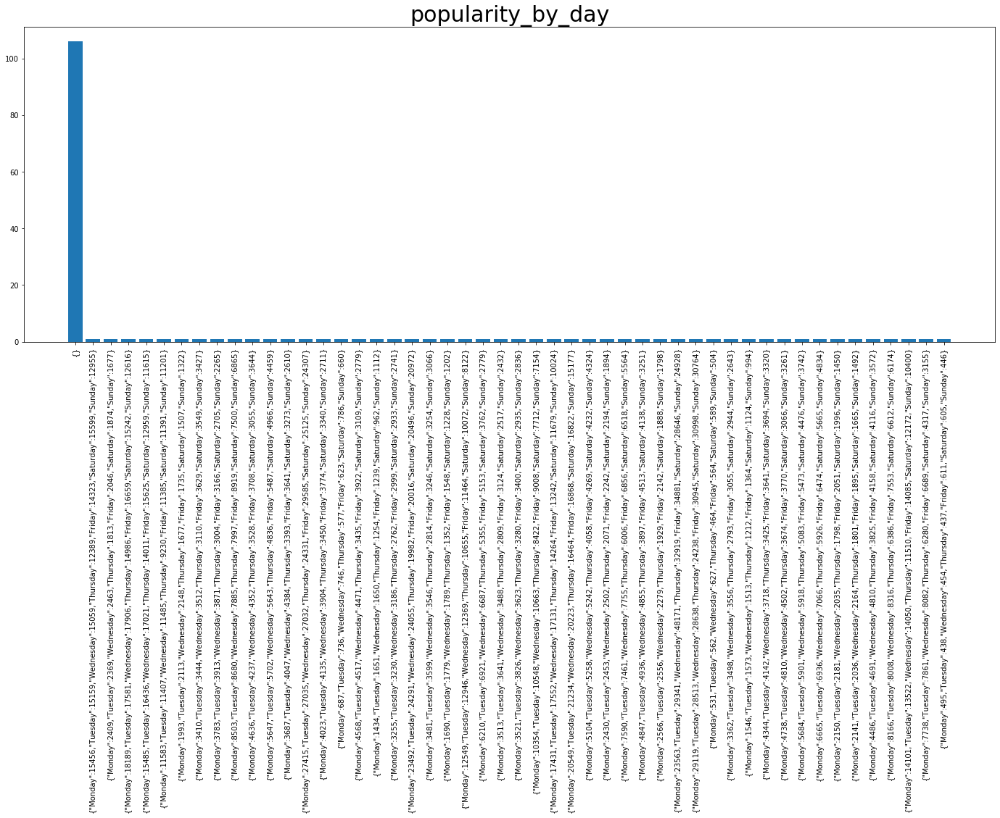

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

descriptive statistics (raw_visit_count):
Min: 60.0000	Q1(25%): 17042.0000 	Q2(50%): 30640.0000 	Q3(75%): 56678.0000 	Max: 7179900.0000
Missing: 106

descriptive statistics (raw_visitor_count):
Min: 50.0000	Q1(25%): 3430.0000 	Q2(50%): 6541.0000 	Q3(75%): 13099.0000 	Max: 6113949.0000
Missing: 106

descriptive statistics (distance_from_home):
Min: 706.0000	Q1(25%): 8584.0000 	Q2(50%): 14614.0000 	Q3(75%): 31397.7500 	Max: 6297845.0000
Missing: 217



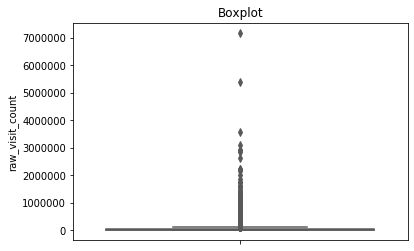

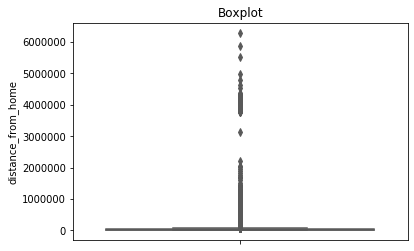

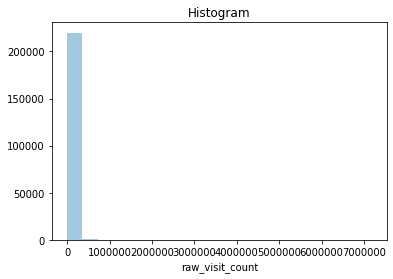

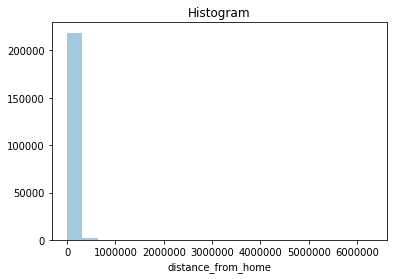

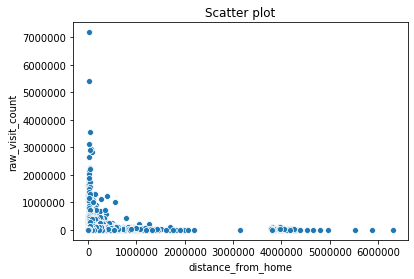

In [16]:
# Nominal index
nominal_index = ['visitor_home_cbgs','visitor_work_cbgs', 'related_same_day_brand', 'related_same_month_brand',
                 'top_brands', 'popularity_by_hour','popularity_by_day']
# Numerical index
numerical_index = ['date_range_start', 'date_range_end','raw_visit_count','raw_visitor_count','distance_from_home']
nominal_summary(cbg_patterns,nominal_index,head_n=50)
numerical_summary(cbg_patterns,numerical_index)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[2],bins=20,new_df=None)

### 缺失值处理与对比

#### 1 将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Float64Index: 220735 entries, 10059508001.0 to nan
Data columns (total 12 columns):
date_range_start            220735 non-null int64
date_range_end              220735 non-null int64
raw_visit_count             220629 non-null float64
raw_visitor_count           220629 non-null float64
visitor_home_cbgs           220735 non-null object
visitor_work_cbgs           220735 non-null object
distance_from_home          220518 non-null float64
related_same_day_brand      220735 non-null object
related_same_month_brand    220735 non-null object
top_brands                  220735 non-null object
popularity_by_hour          220735 non-null object
popularity_by_day           220735 non-null object
dtypes: float64(3), int64(2), object(7)
memory usage: 21.9+ MB
None
(220735, 12)

<class 'pandas.core.frame.DataFrame'>
Float64Index: 220518 entries, 10059508001.0 to 721130714022.0
Data columns (total 12 columns):
date_range_start            220518 non-null int64


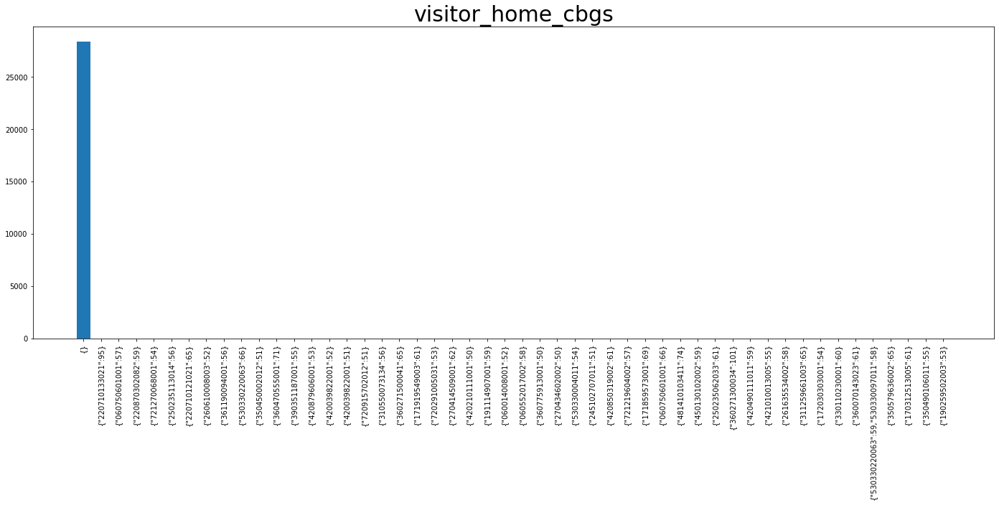

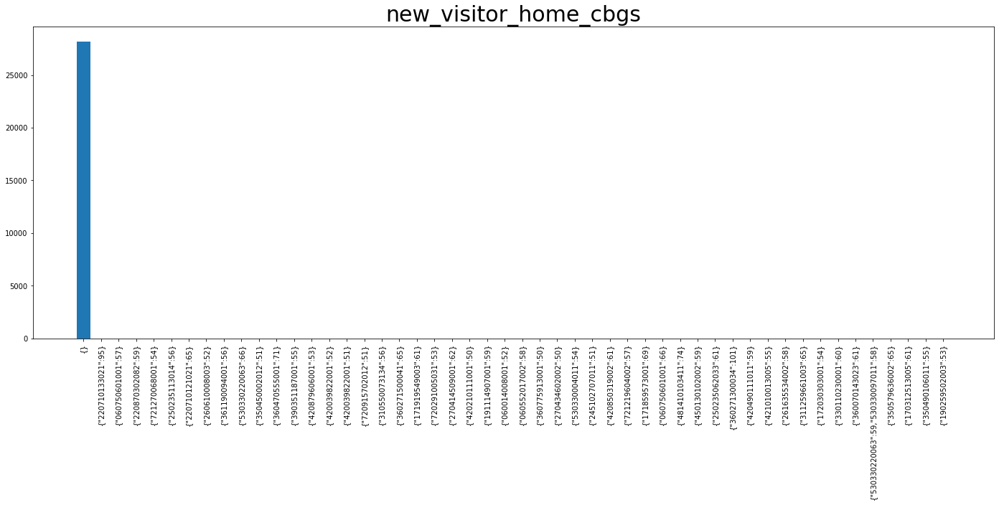

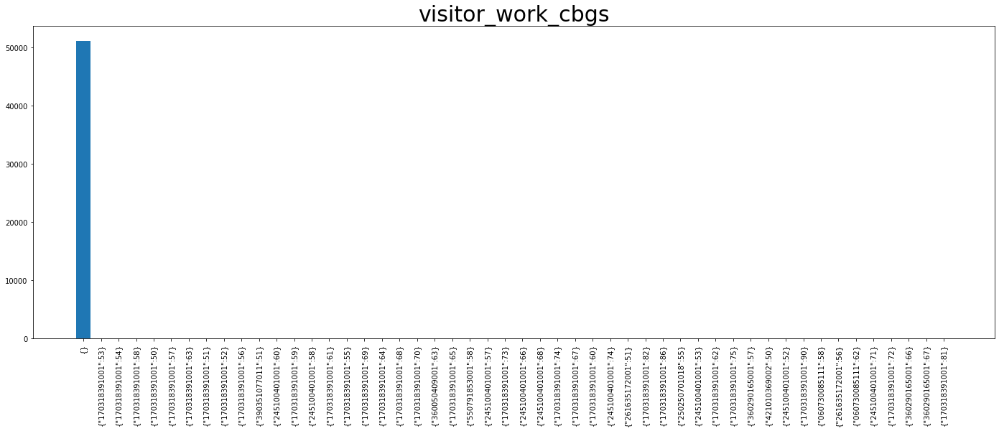

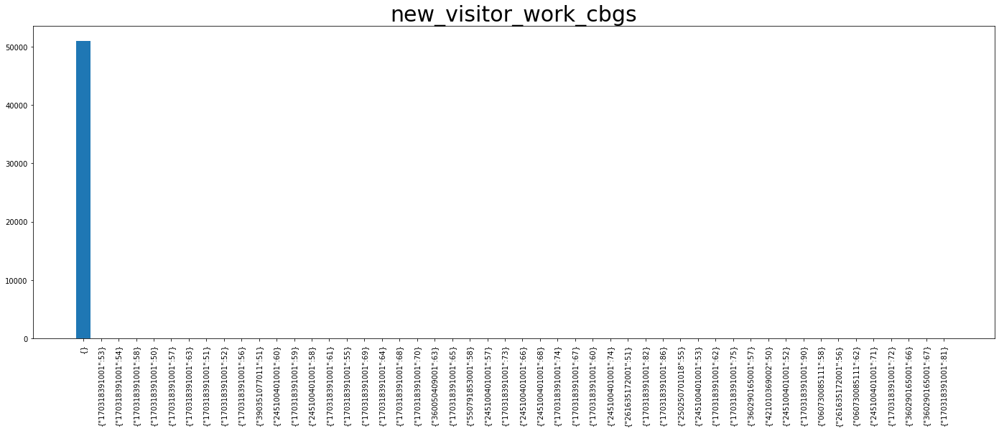

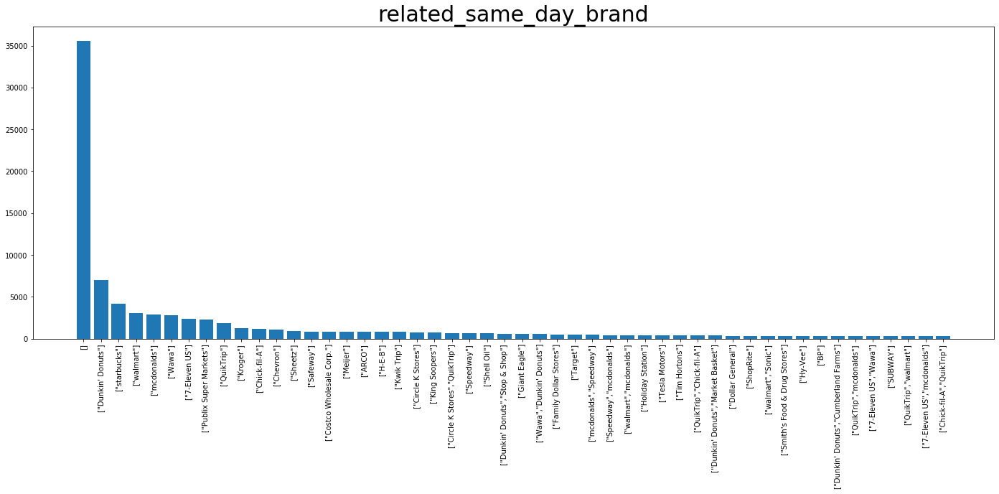

...

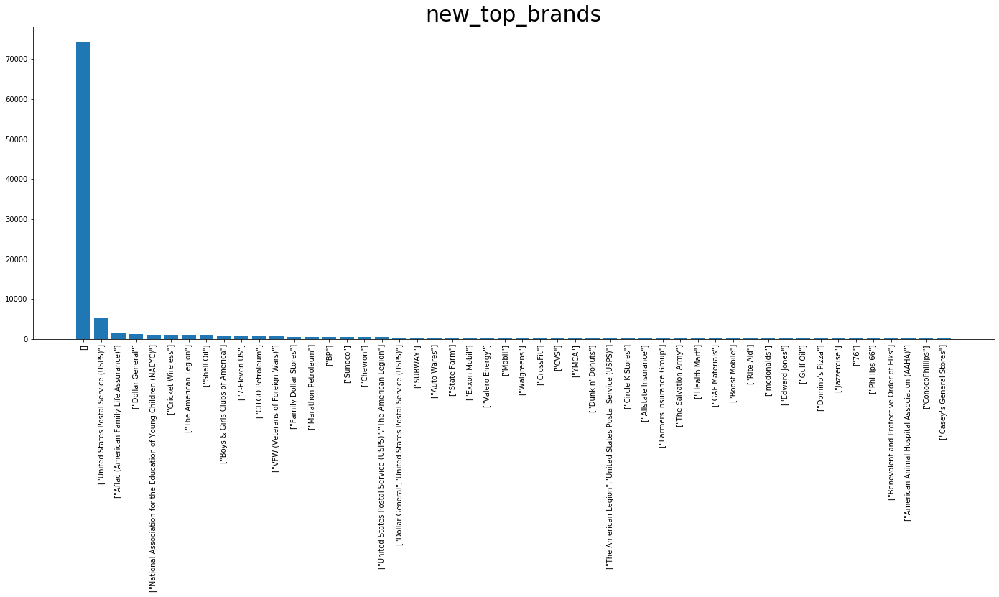

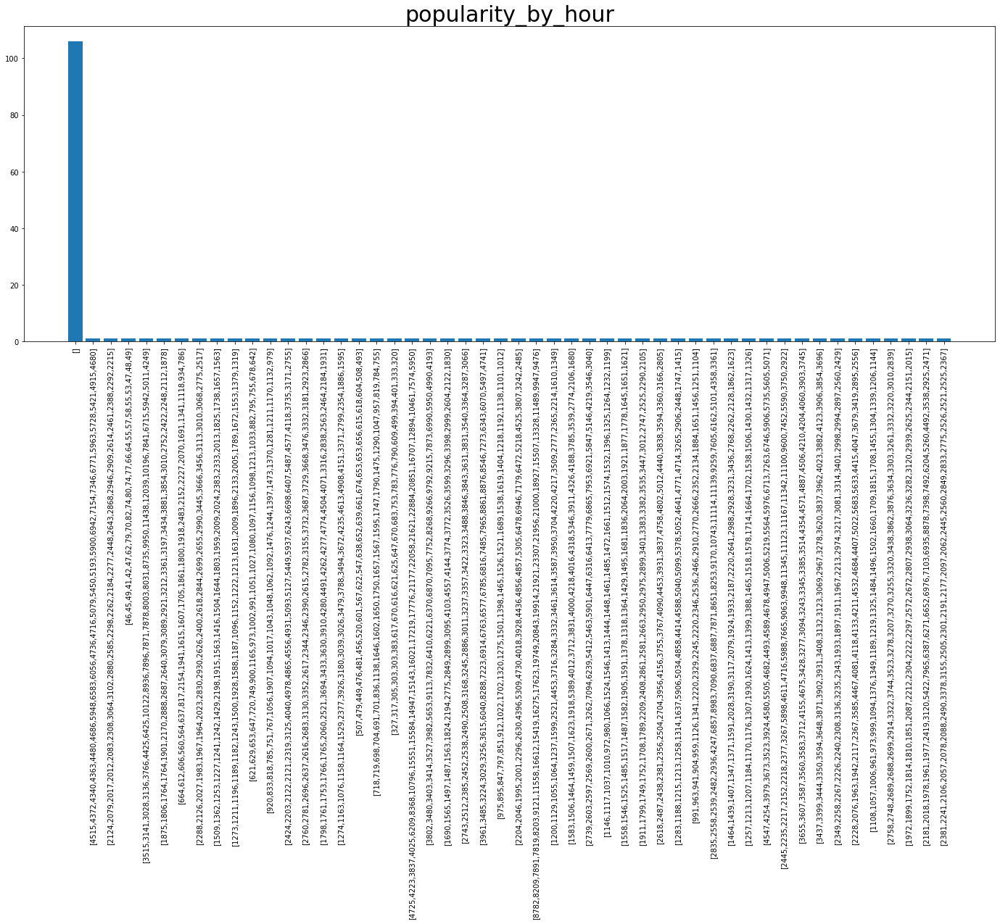

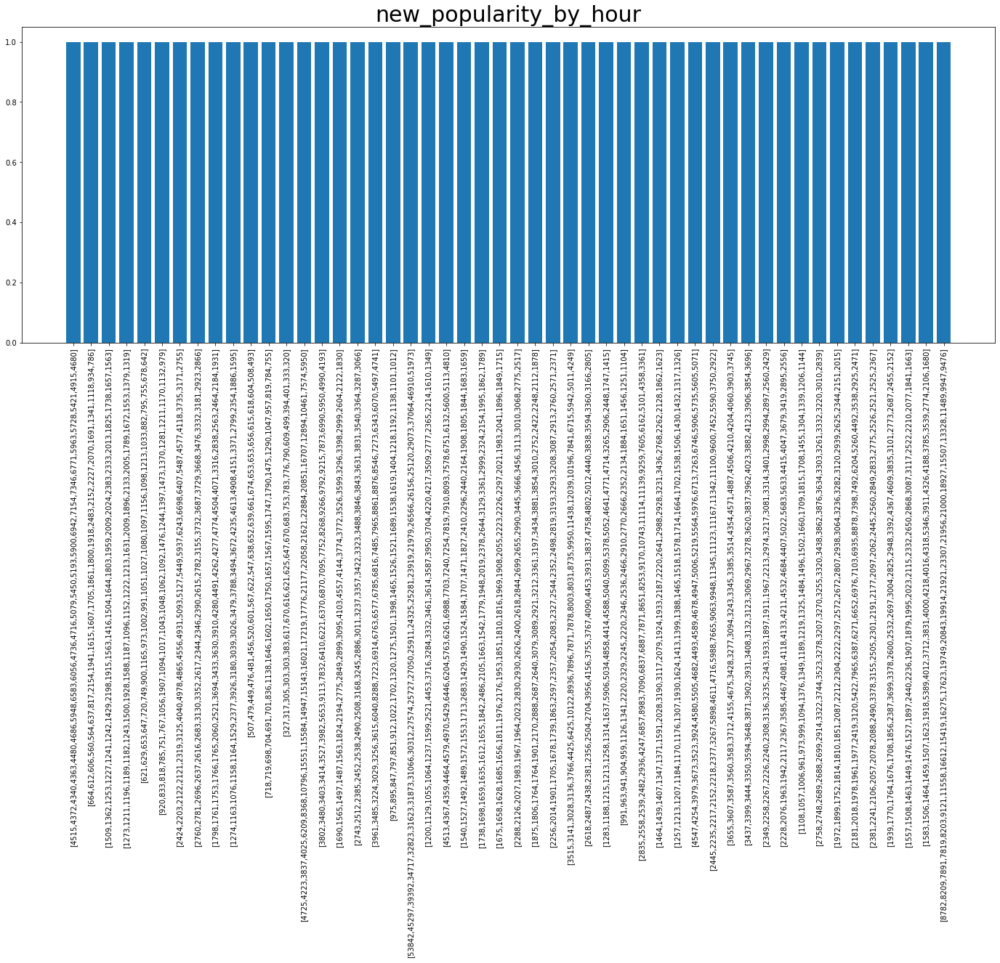

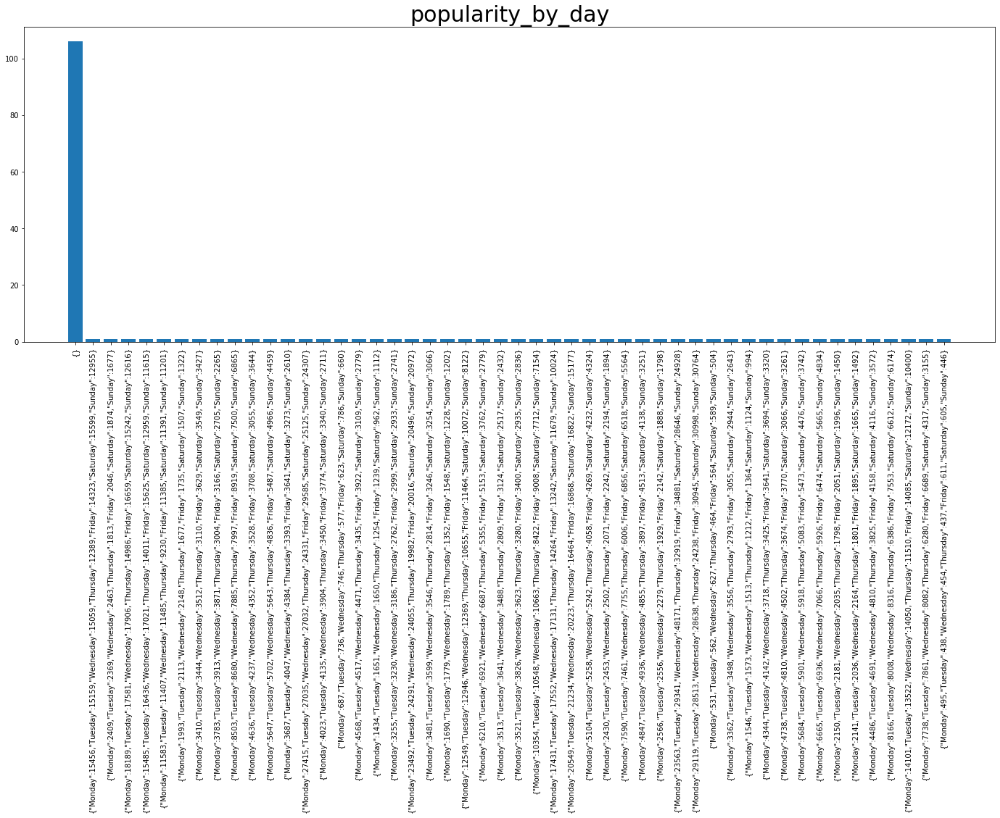

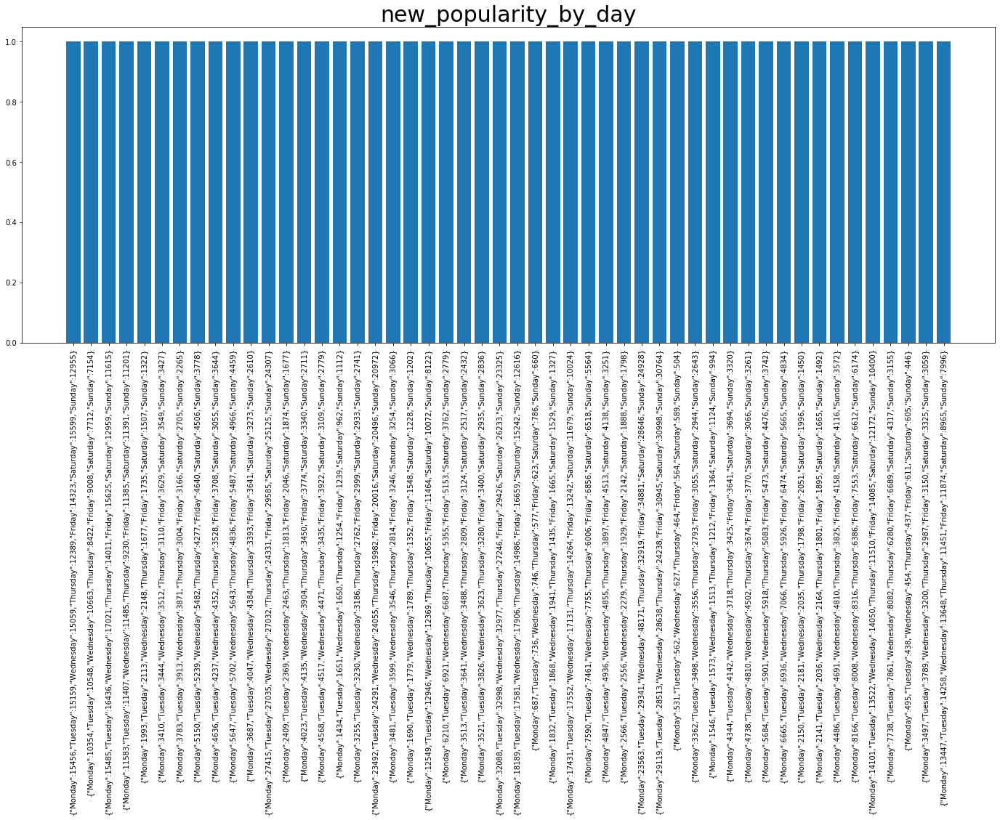

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

new Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
new Missing: 217

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

new Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
new Missing: 217

descriptive statistics (raw_visit_count):
Min: 60.0000	Q1(25%): 17042.0000 	Q2(50%): 30640.0000 	Q3(75%): 56678.0000 	Max: 7179900.0000
Missing: 106

new Min: 86.0000	Q1(25%): 17059.0000 	Q2(50%): 30657.0000 	Q3(75%): 56700.5000 	Max: 7179900.0000
new Missing: 217

descriptive statistics (raw_visitor_count):
Min: 50.0000	Q1(25%): 3430.0000 	Q2(50%): 6541.0000 	Q3(75

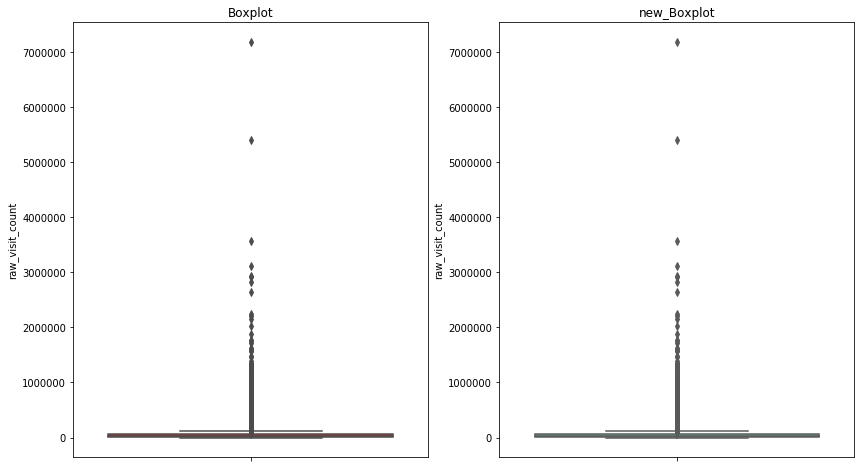

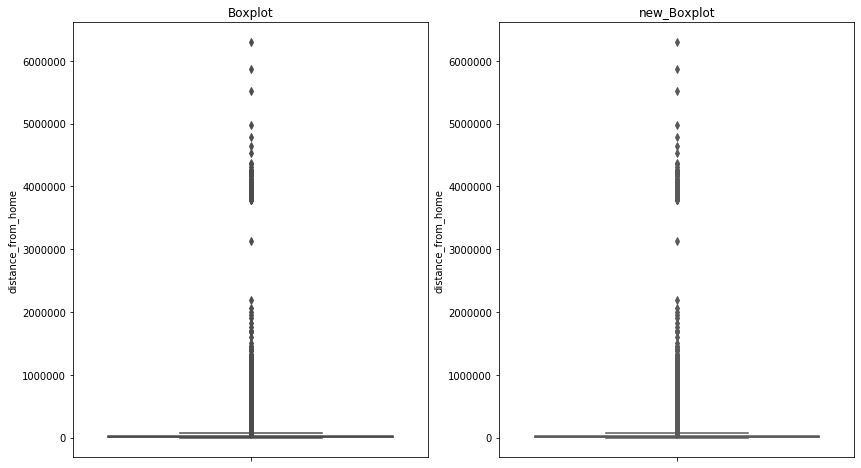

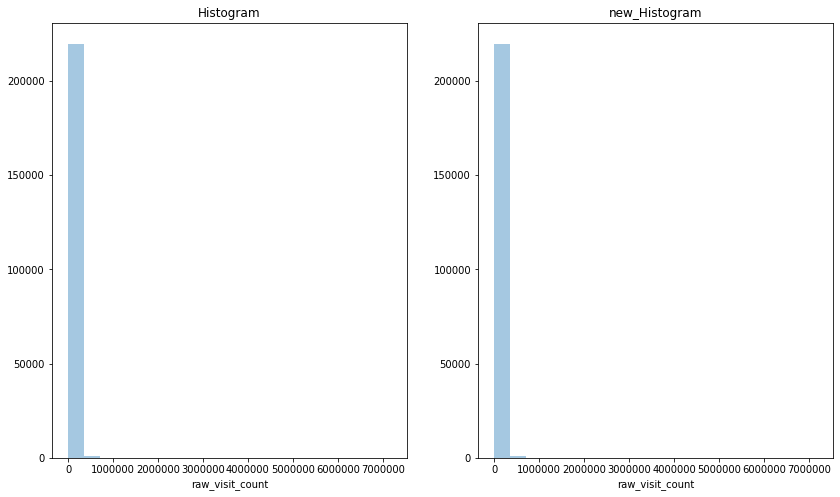

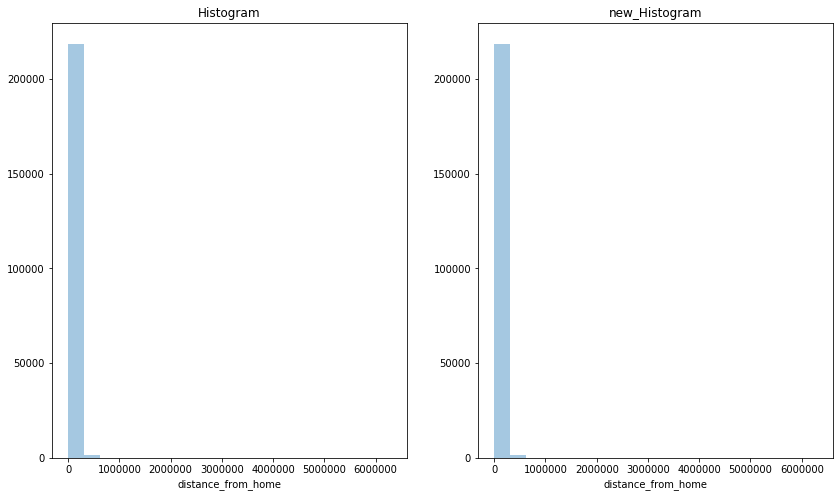

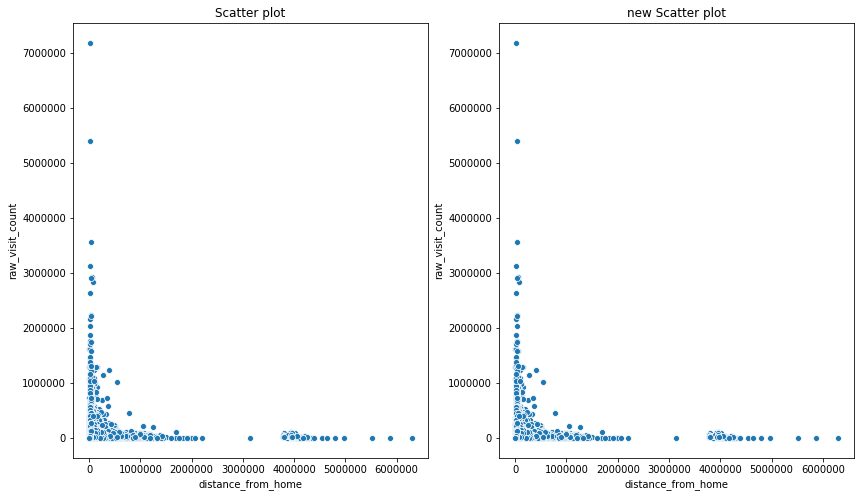

In [17]:
dwcbg=miss_drop(cbg_patterns)
columns_info(cbg_patterns,show_shape=True,new_df=dwcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=dwcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=dwcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[2],bins=20,new_df=dwcbg)

#### 2 用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Float64Index: 220735 entries, 10059508001.0 to nan
Data columns (total 12 columns):
date_range_start            220735 non-null int64
date_range_end              220735 non-null int64
raw_visit_count             220629 non-null float64
raw_visitor_count           220629 non-null float64
visitor_home_cbgs           220735 non-null object
visitor_work_cbgs           220735 non-null object
distance_from_home          220518 non-null float64
related_same_day_brand      220735 non-null object
related_same_month_brand    220735 non-null object
top_brands                  220735 non-null object
popularity_by_hour          220735 non-null object
popularity_by_day           220735 non-null object
dtypes: float64(3), int64(2), object(7)
memory usage: 21.9+ MB
None
(220735, 12)

<class 'pandas.core.frame.DataFrame'>
Float64Index: 220735 entries, 10059508001.0 to nan
Data columns (total 12 columns):
date_range_start            220735 non-null int64
date_range_

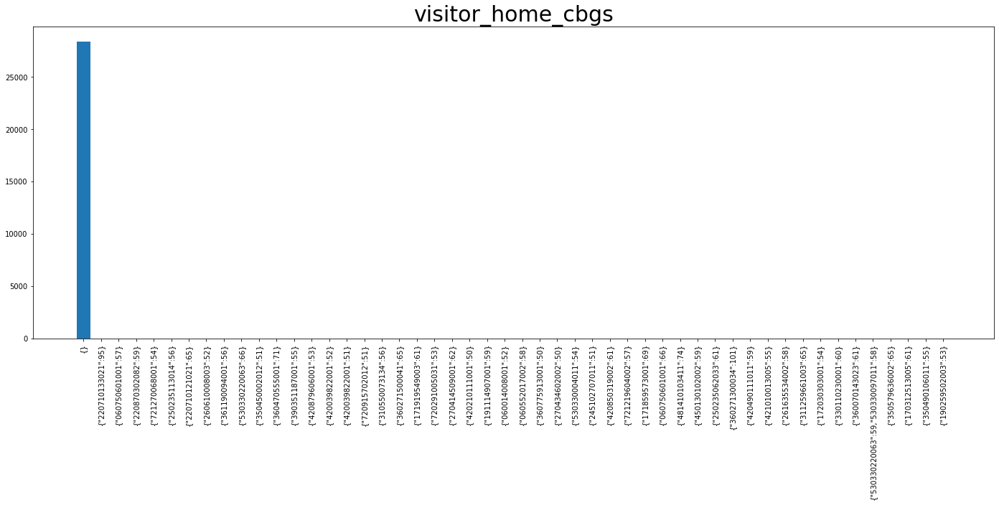

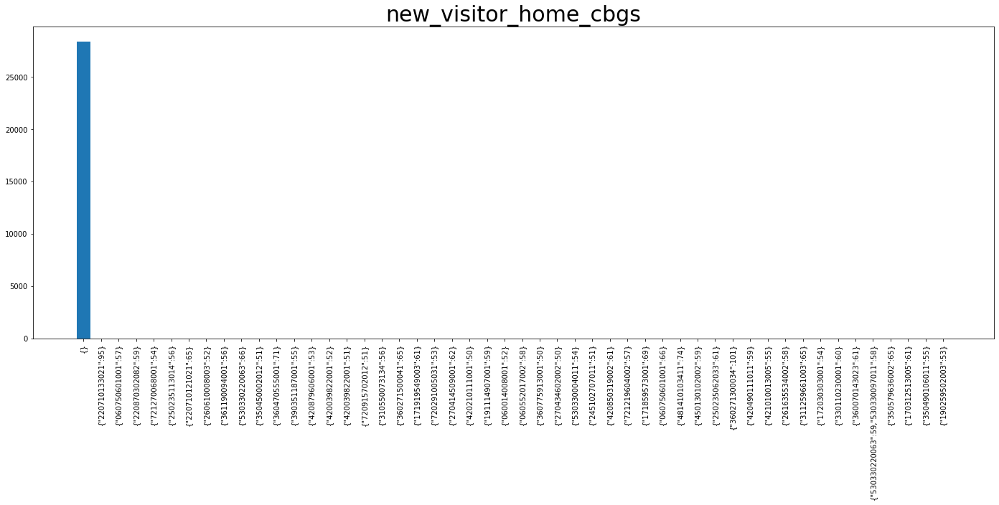

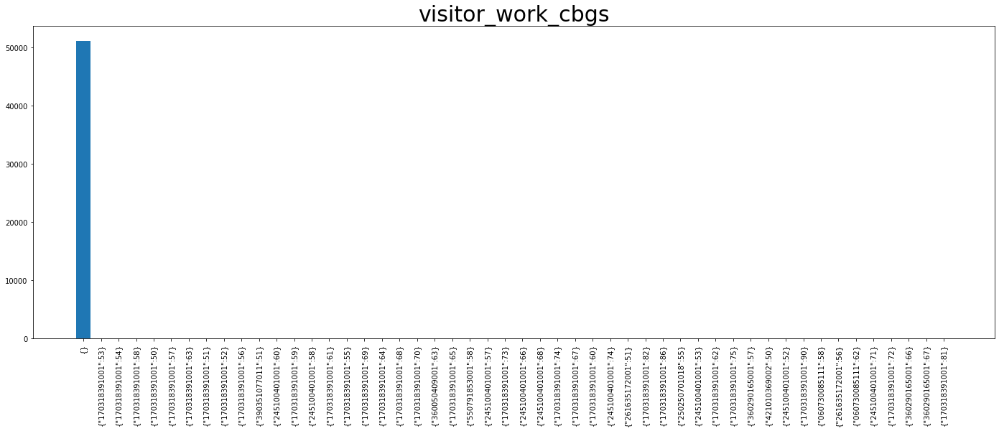

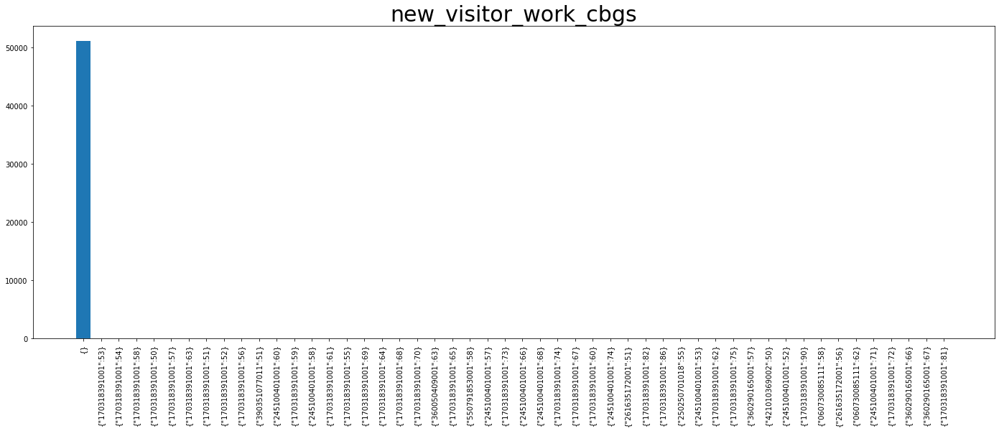

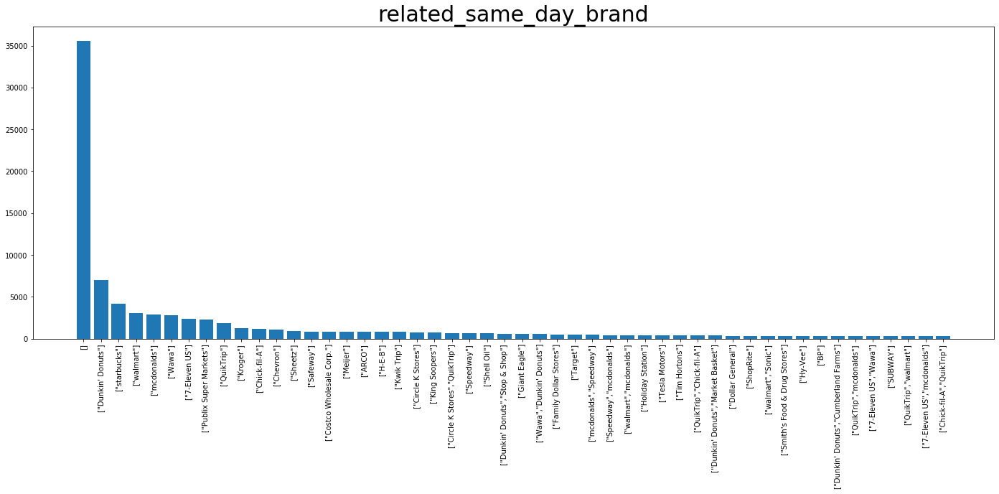

...

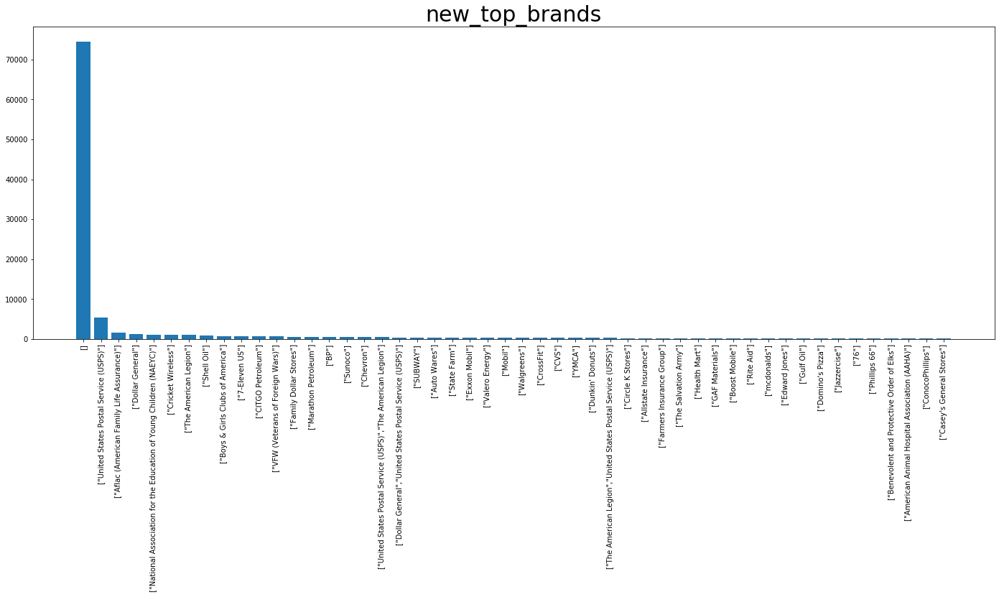

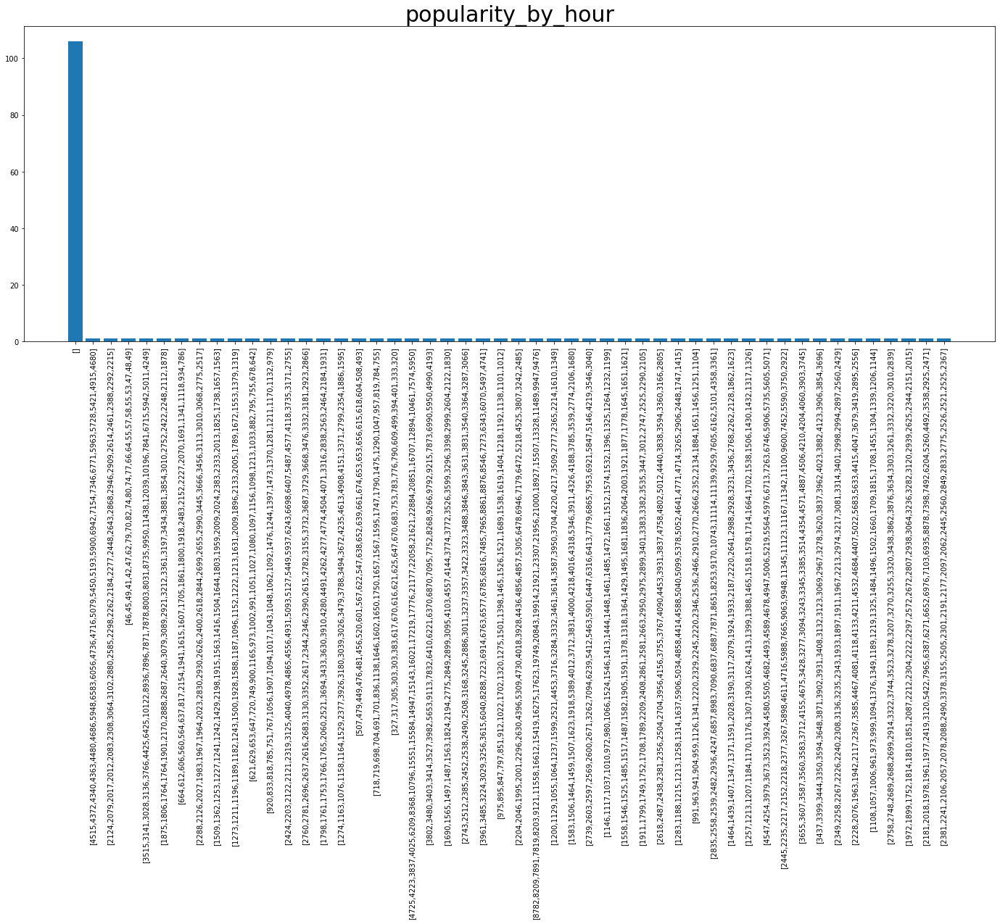

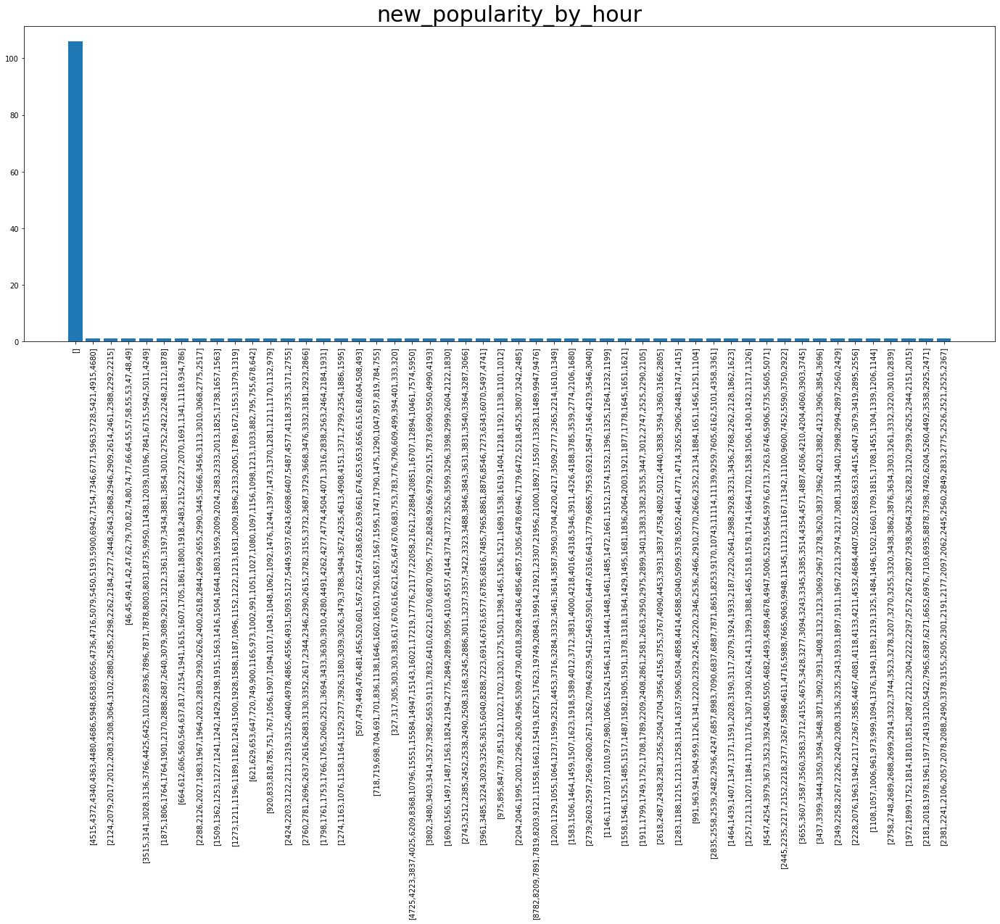

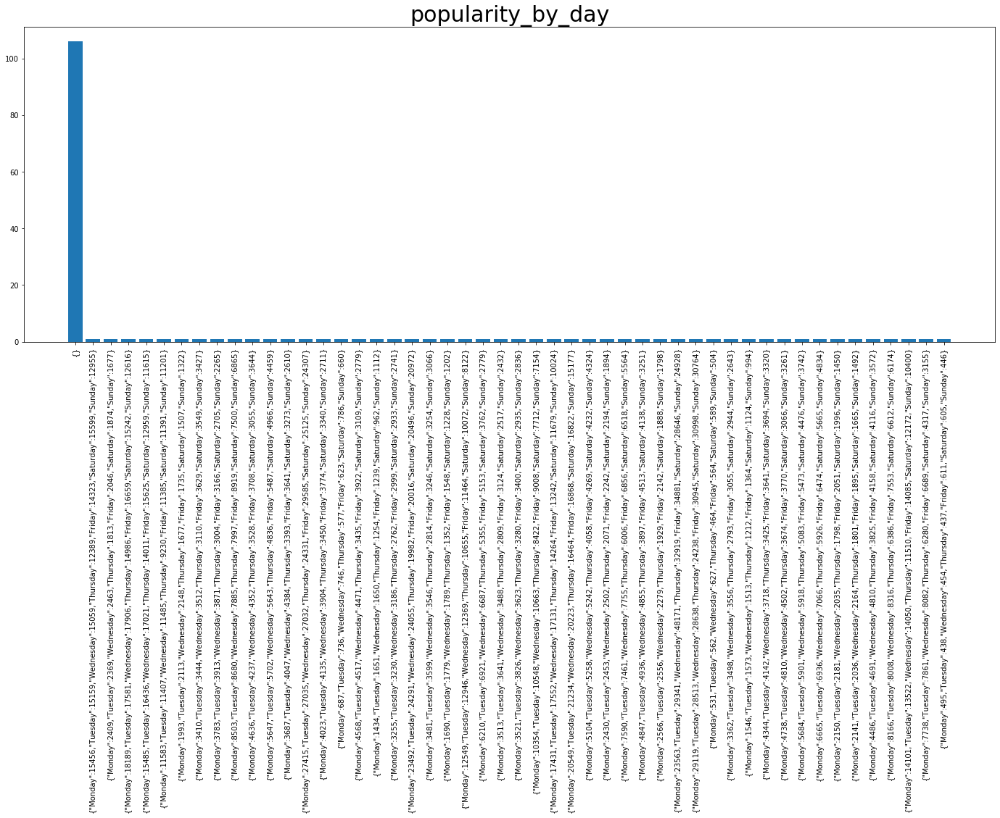

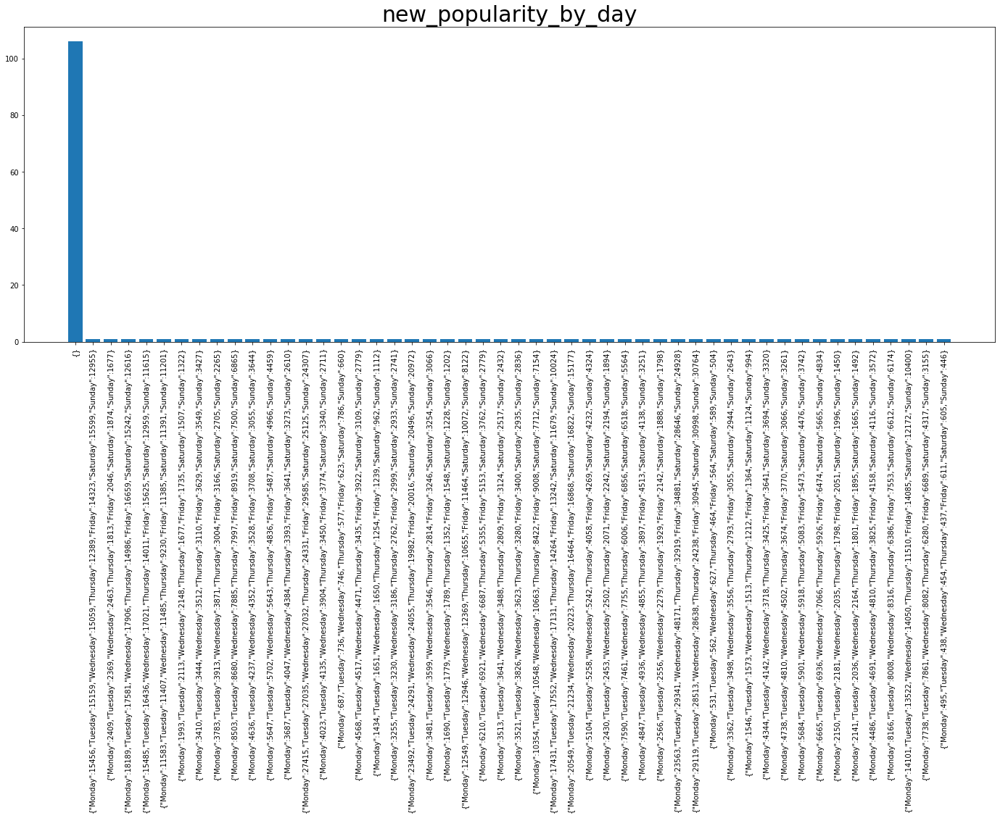

descriptive statistics (date_range_start):
Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
Missing: 0

new Min: 1538352000.0000	Q1(25%): 1538352000.0000 	Q2(50%): 1538352000.0000 	Q3(75%): 1538352000.0000 	Max: 1538352000.0000
new Missing: 0

descriptive statistics (date_range_end):
Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
Missing: 0

new Min: 1541030400.0000	Q1(25%): 1541030400.0000 	Q2(50%): 1541030400.0000 	Q3(75%): 1541030400.0000 	Max: 1541030400.0000
new Missing: 0

descriptive statistics (raw_visit_count):
Min: 60.0000	Q1(25%): 17042.0000 	Q2(50%): 30640.0000 	Q3(75%): 56678.0000 	Max: 7179900.0000
Missing: 106

new Min: 60.0000	Q1(25%): 17047.0000 	Q2(50%): 30625.0000 	Q3(75%): 56652.0000 	Max: 7179900.0000
new Missing: 0

descriptive statistics (raw_visitor_count):
Min: 50.0000	Q1(25%): 3430.0000 	Q2(50%): 6541.0000 	Q3(75%): 13

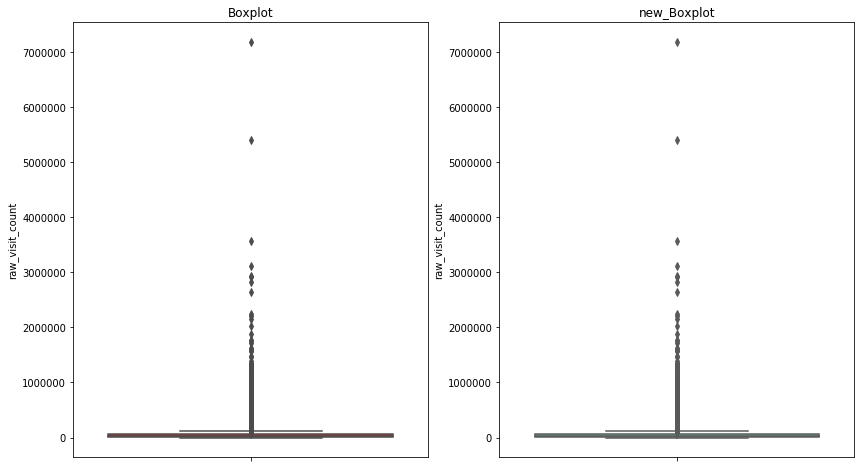

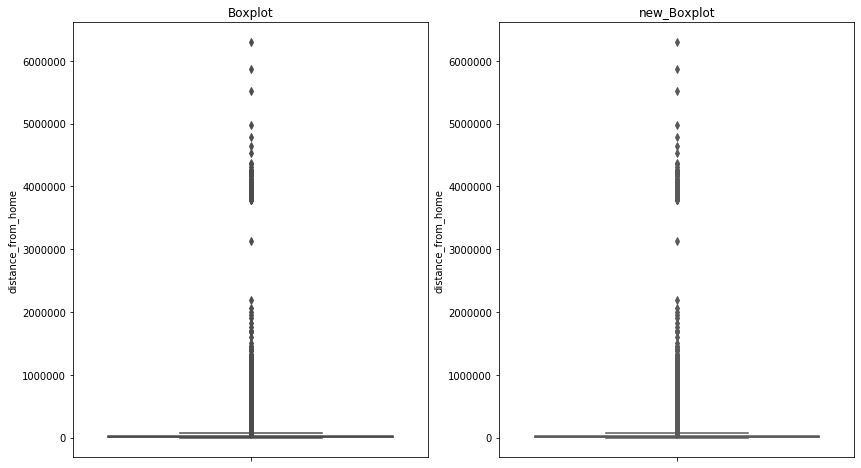

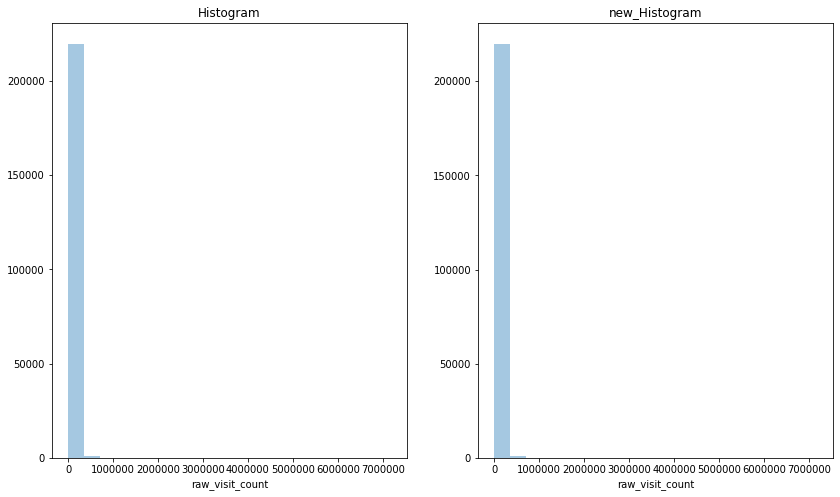

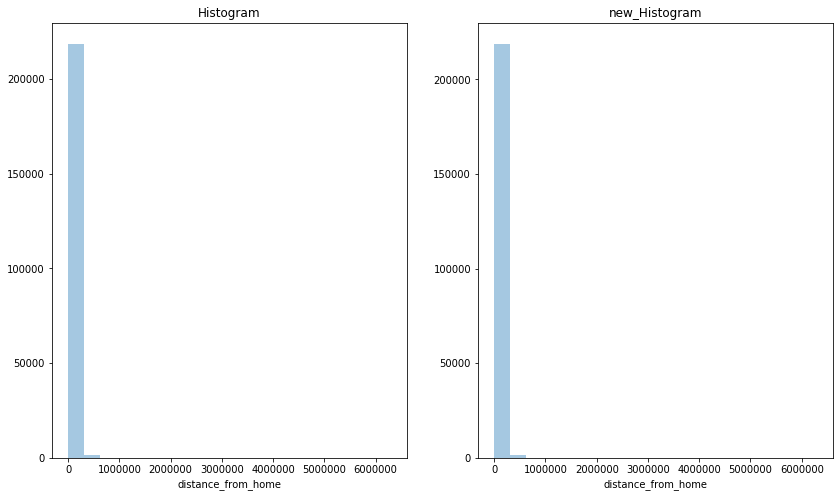

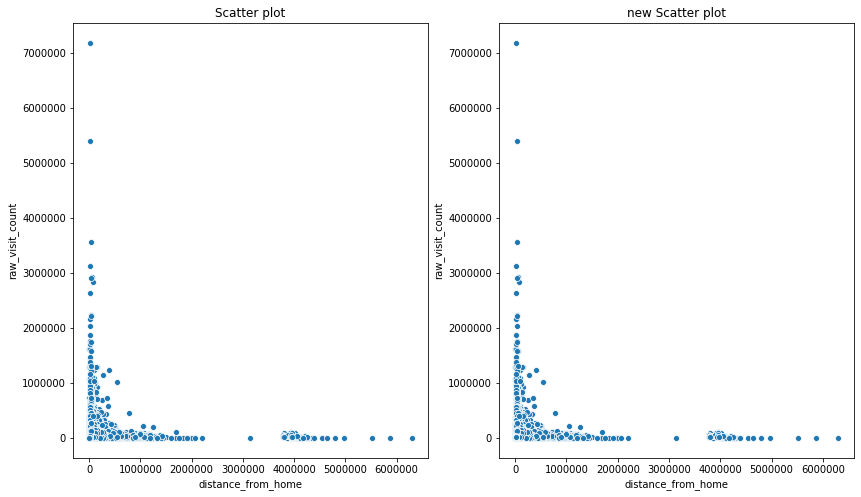

In [18]:
mdcbg=miss_mode_fill(cbg_patterns)
columns_info(cbg_patterns,show_shape=True,new_df=mdcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=mdcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=mdcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[2],bins=20,new_df=mdcbg)